<a href="https://colab.research.google.com/github/Epalaciol/VisionArtificial_2021_Retinas/blob/master/TrabajoRetinas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

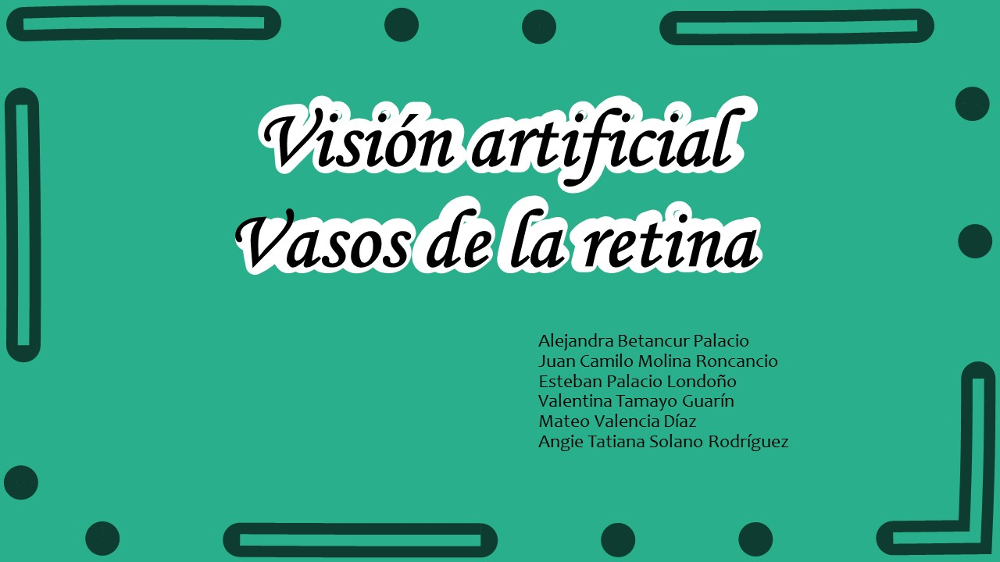



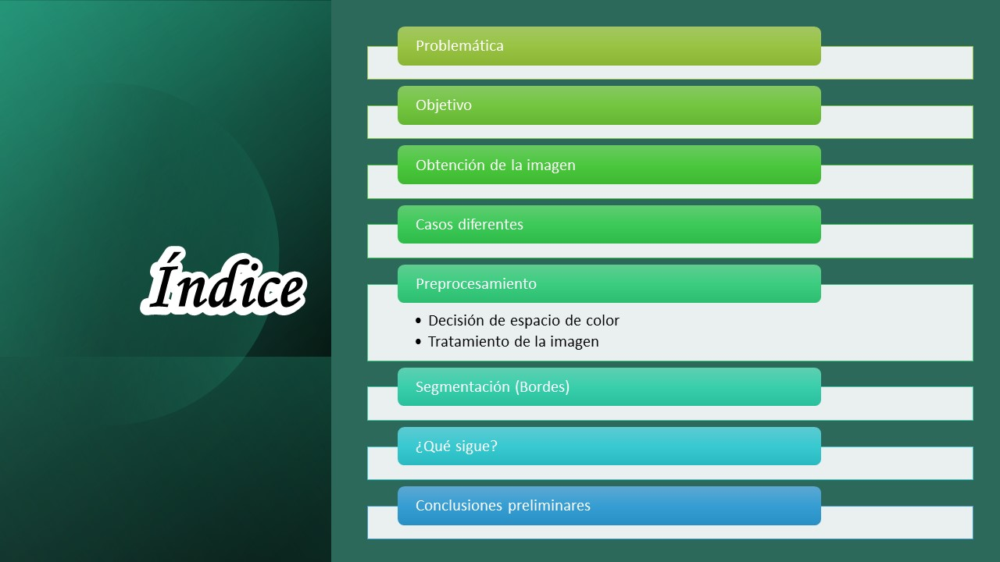

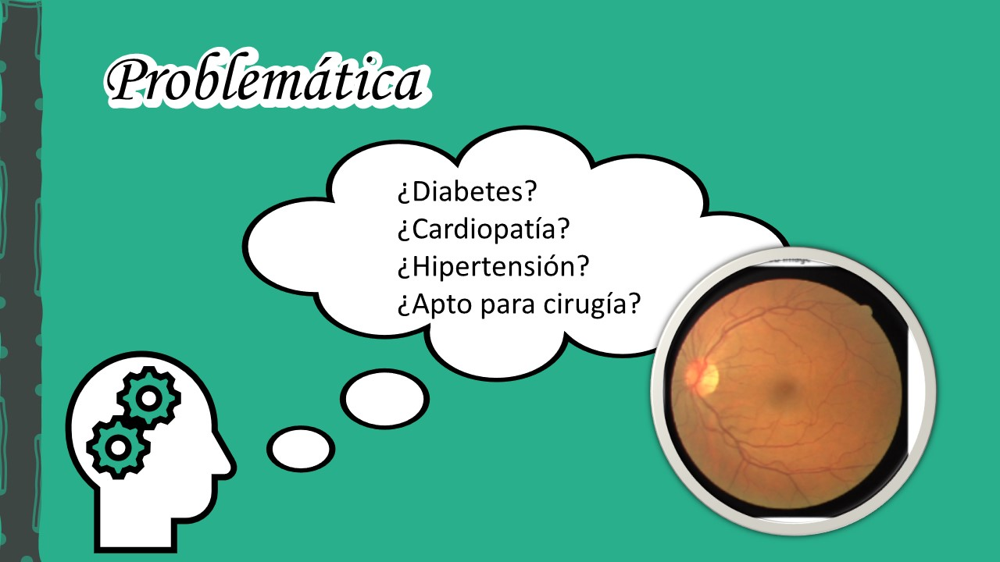

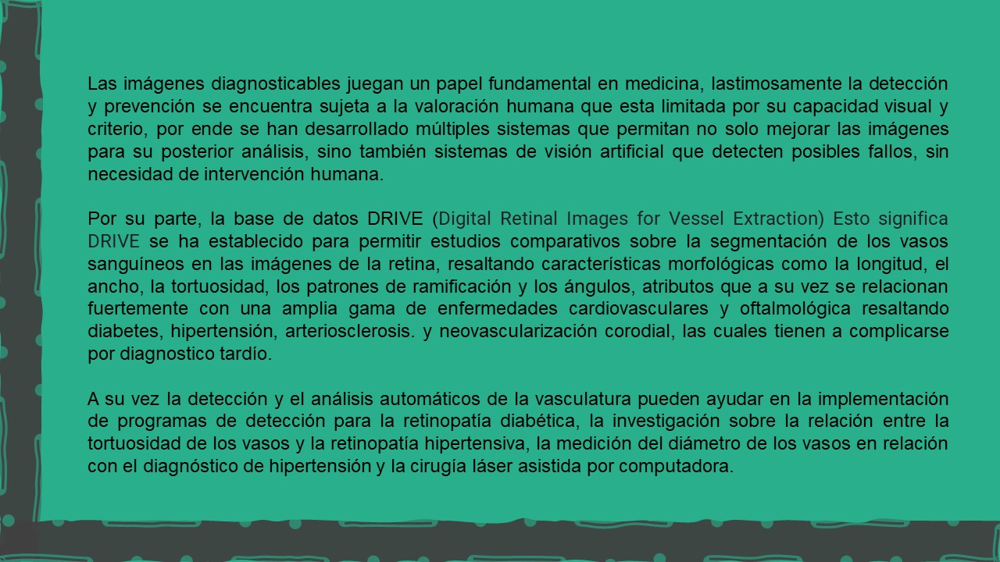

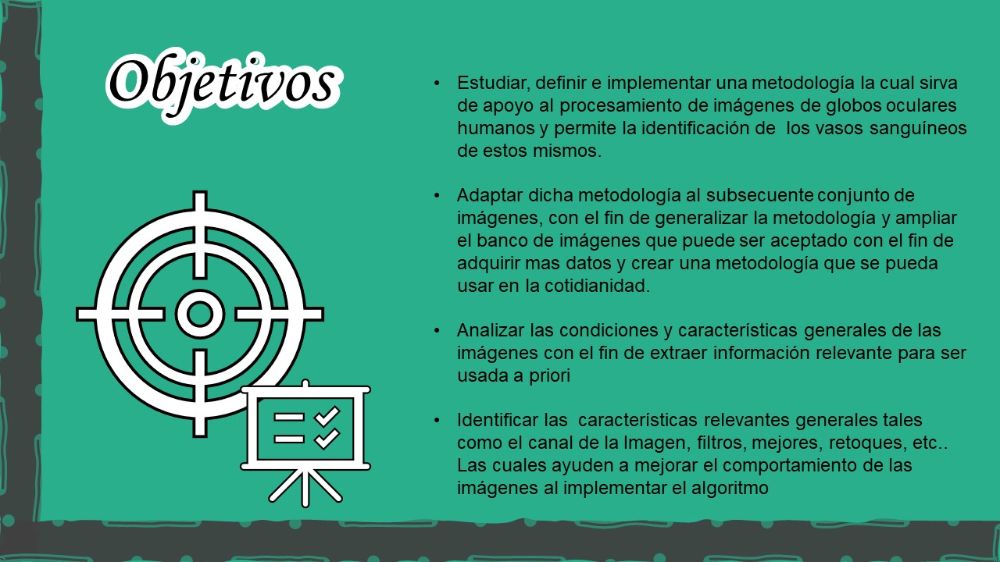

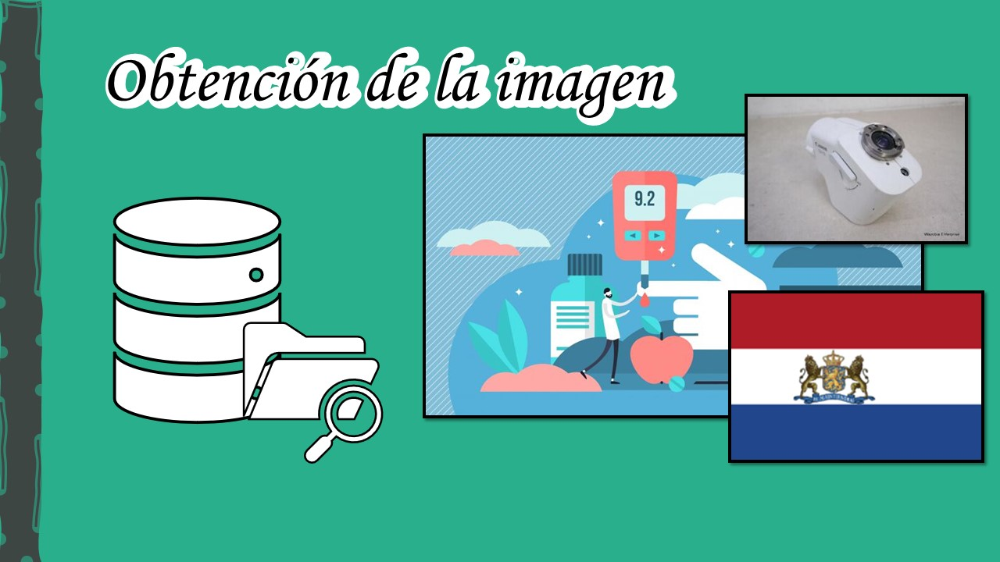

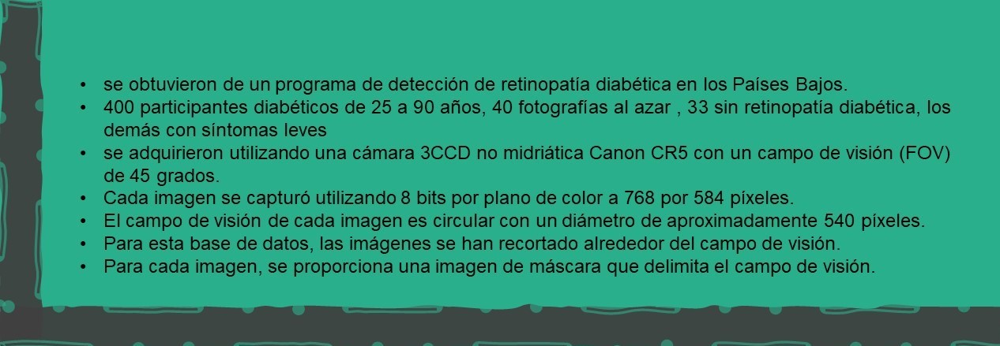

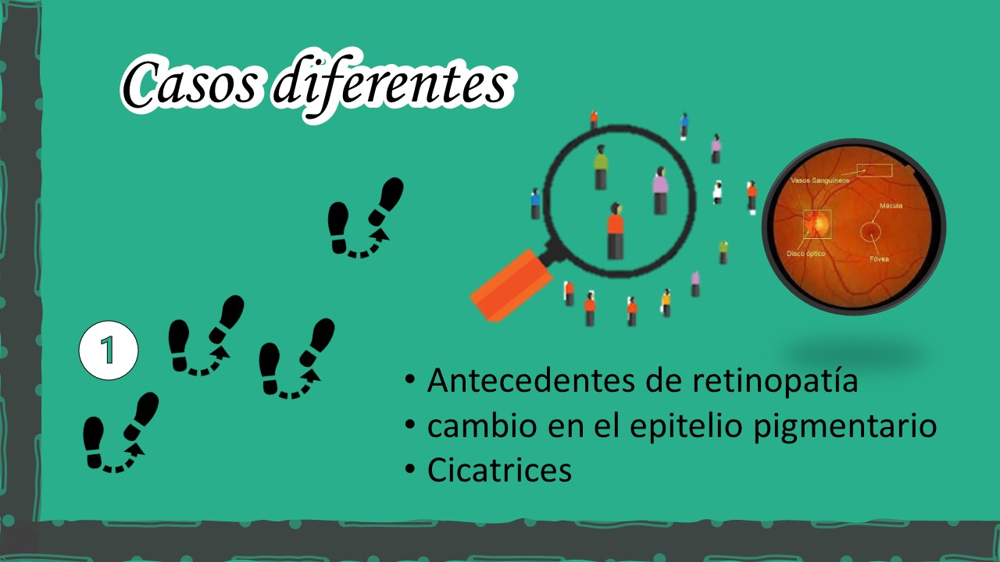

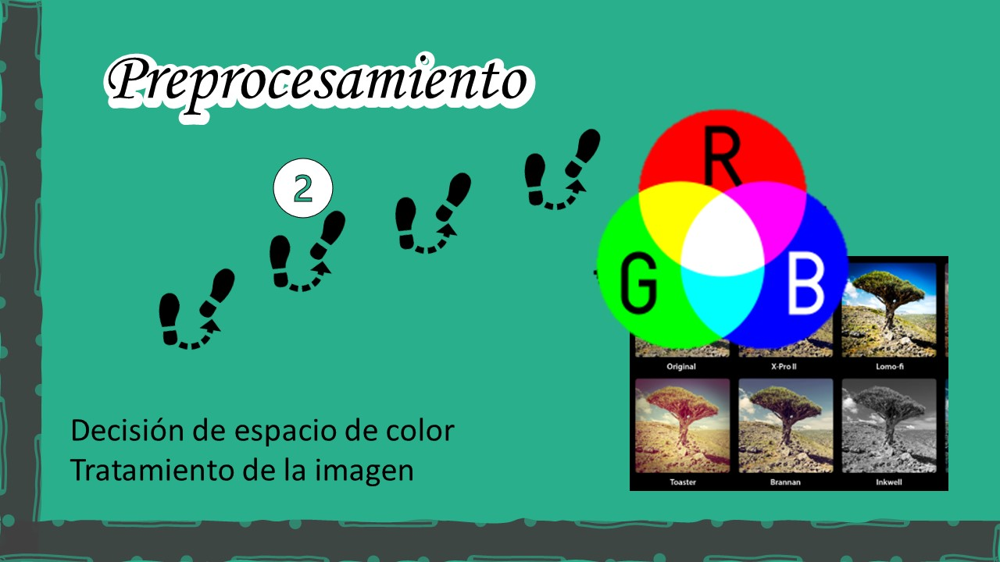

In [46]:
!pip install opencv-contrib-python

Error processing line 1 of c:\users\usser\appdata\local\programs\python\python38\lib\site-packages\vision-1.0.0-py3.8-nspkg.pth:

  Traceback (most recent call last):
    File "c:\users\usser\appdata\local\programs\python\python38\lib\site.py", line 169, in addpackage
      exec(line)
    File "<string>", line 1, in <module>
    File "<frozen importlib._bootstrap>", line 553, in module_from_spec
  AttributeError: 'NoneType' object has no attribute 'loader'

Remainder of file ignored
You should consider upgrading via the 'c:\users\usser\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


In [47]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import math
import skimage.morphology as morph
from skimage import io, color
import skimage

In [48]:
#Construimos una funcion que nos facilita la lectura de las imagenes

def img_read(filename, mode = 'color'):
    if(mode == 'color'):   
        return cv2.cvtColor(cv2.imread(filename),cv2.COLOR_BGR2RGB)
    elif(mode=='grayscale' or mode=='greyscale' or mode == 'gray' or mode == 'grey'):
        return cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
    elif(mode=='yuv' or mode=='YUV'):
        return cv2.cvtColor(cv2.imread(filename),cv2.COLOR_BGR2YUV)
    elif(mode=='hsv' or mode=='HSV'):
        return cv2.cvtColor(cv2.imread(filename),cv2.COLOR_BGR2HSV)
    elif(mode=='lab' or mode=='LAB'):
        return cv2.cvtColor(cv2.imread(filename),cv2.COLOR_BGR2LAB)
    else:
        return None

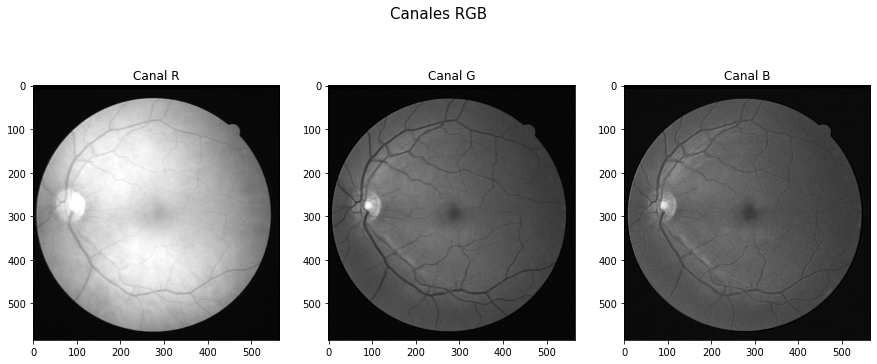

In [49]:
img_rgb = img_read('images/training/images/35_training.tif')

#Modelo RGB
img_R = img_rgb[:,:,0]
img_G = img_rgb[:,:,1]
img_B = img_rgb[:,:,2]

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15, 6))

fig.suptitle('Canales RGB', fontsize=15)
ax1.set_title('Canal R')
ax1.imshow(img_R, cmap='gray')
ax2.set_title('Canal G')
ax2.imshow(img_G, cmap='gray')
ax3.set_title('Canal B')
ax3.imshow(img_B, cmap='gray')


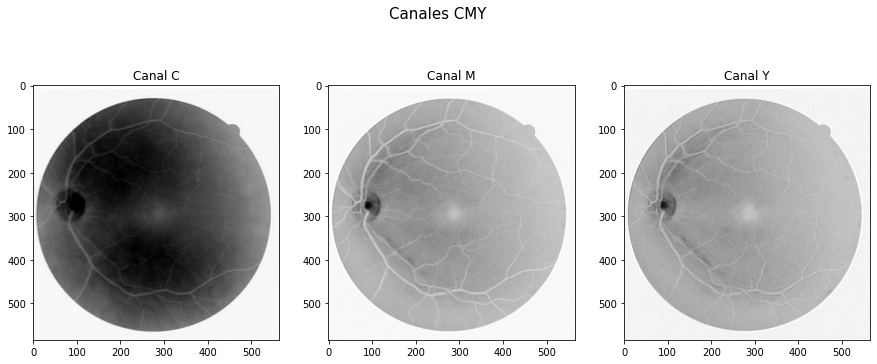

In [50]:
img_cmy = img_read('images/training/images/35_training.tif')

#Modelo CMY
img_C= 255 - img_cmy[:,:,0]
img_M = 255 - img_cmy[:,:,1]
img_Y = 255 - img_cmy[:,:,2]

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15, 6))

fig.suptitle('Canales CMY', fontsize=15)
ax1.set_title('Canal C')
ax1.imshow(img_C, cmap='gray')
ax2.set_title('Canal M')
ax2.imshow(img_M, cmap='gray')
ax3.set_title('Canal Y')
ax3.imshow(img_Y, cmap='gray')

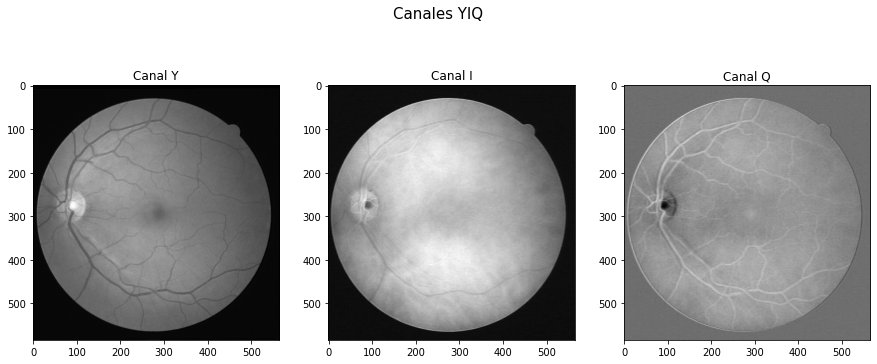

In [51]:
img_yiq = img_read('images/training/images/35_training.tif')

#Modelo YIQ
img_R = img_yiq[:,:,0]
img_G = img_yiq[:,:,1]
img_B = img_yiq[:,:,2]

img_Y = 0.299*img_R + 0.587*img_G + 0.114*img_B
img_I = 0.596*img_R - 0.274*img_G - 0.322*img_B
img_Q = 0.211*img_R - 0.523*img_G + 0.312*img_B

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15, 6))

fig.suptitle('Canales YIQ', fontsize=15)
ax1.set_title('Canal Y')
ax1.imshow(img_Y, cmap='gray')
ax2.set_title('Canal I')
ax2.imshow(img_I, cmap='gray')
ax3.set_title('Canal Q')
ax3.imshow(img_Q, cmap='gray')

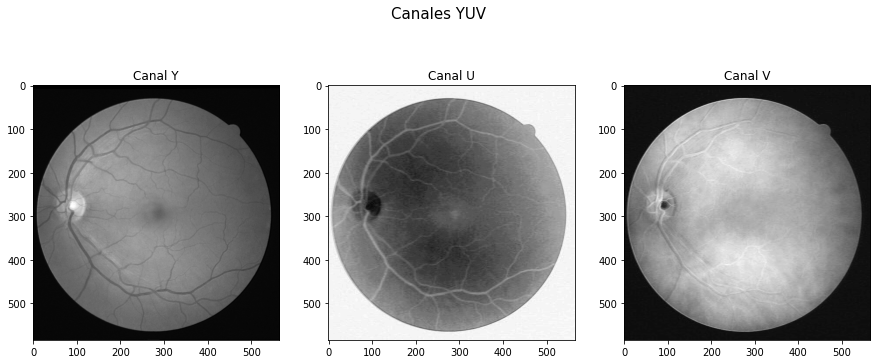

In [52]:
img_yuv = img_read('images/training/images/35_training.tif',mode="yuv")

#Modelo YUV

img_Y = img_yuv[:,:,0]
img_U =  img_yuv[:,:,1]
img_V = img_yuv[:,:,2]

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15, 6))

fig.suptitle('Canales YUV', fontsize=15)
ax1.set_title('Canal Y')
ax1.imshow(img_Y, cmap='gray')
ax2.set_title('Canal U')
ax2.imshow(img_U, cmap='gray')
ax3.set_title('Canal V')
ax3.imshow(img_V, cmap='gray')

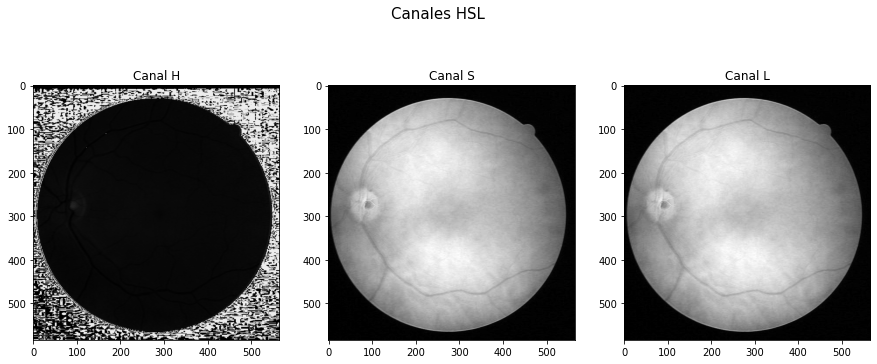

In [53]:
img_HSL = img_read('images/training/images/35_training.tif')

#Modelo HSL

img_rgb = img_HSL.astype(np.float32)/255
img_R = img_rgb[:,:,0]
img_G = img_rgb[:,:,1]
img_B = img_rgb[:,:,2]

tam = np.shape(img_rgb)
img_hsl =np.zeros((tam), dtype=np.float32)

for i in range(tam[0]):
    for j in range(tam[1]):
        max_val = np.max(img_rgb[i][j])
        min_val = np.min(img_rgb[i][j])
        s = max_val - min_val
        l = s/2
        img_hsl[i][j][1] = s
        img_hsl[i][j][2] = l
        if(max_val==min_val):
            img_hsl[i][j][0] = 0
            continue
        red = img_rgb[i][j][0]
        green = img_rgb[i][j][1]
        blue = img_rgb[i][j][2]
        if(max_val == red):
            h = (green-blue)*60/(max_val-min_val)
        elif(max_val == green):
            h = (blue-red)*60/(max_val-min_val) + 120
        else:
            h = (red-green)*60/(max_val-min_val) + 240
        if h >= 0:
            img_hsl[i,j,0]=h
        else:
            img_hsl[i,j,0] = 360.0 - h

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15, 6))

fig.suptitle('Canales HSL', fontsize=15)
ax1.set_title('Canal H')
ax1.imshow(img_hsl[:,:,0], cmap='gray')
ax2.set_title('Canal S')
ax2.imshow(img_hsl[:,:,1], cmap='gray')
ax3.set_title('Canal L')
ax3.imshow(img_hsl[:,:,2], cmap='gray')


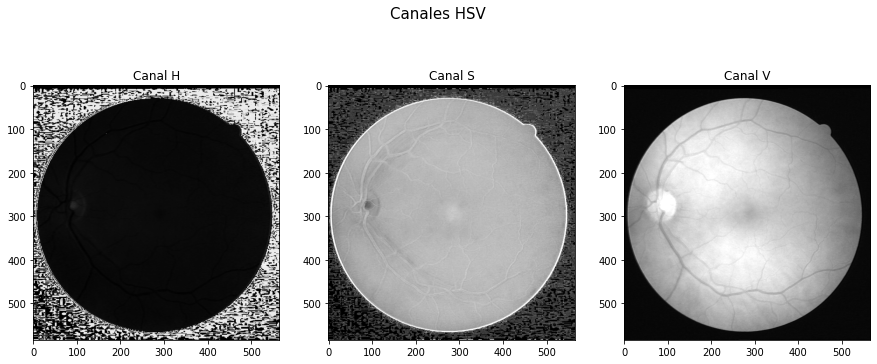

In [54]:
img_hsv = img_read('images/training/images/35_training.tif',mode="hsv")

#Modelo HSV

img_H = img_hsv[:,:,0]
img_S =  img_hsv[:,:,1]
img_V = img_hsv[:,:,2]

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15, 6))

fig.suptitle('Canales HSV', fontsize=15)
ax1.set_title('Canal H')
ax1.imshow(img_H, cmap='gray')
ax2.set_title('Canal S')
ax2.imshow(img_S, cmap='gray')
ax3.set_title('Canal V')
ax3.imshow(img_V, cmap='gray')

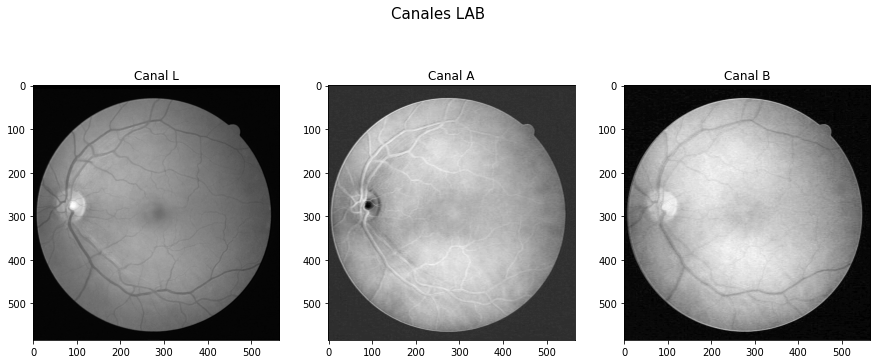

In [55]:
img_lab = img_read('images/training/images/35_training.tif',mode="lab")

#Modelo LAB

img_L = img_lab[:,:,0]
img_A =  img_lab[:,:,1]
img_B = img_lab[:,:,2]

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15, 6))
fig.suptitle('Canales LAB', fontsize=15)
ax1.set_title('Canal L')
ax1.imshow(img_L, cmap='gray')
ax2.set_title('Canal A')
ax2.imshow(img_A, cmap='gray')
ax3.set_title('Canal B')
ax3.imshow(img_B, cmap='gray')

# Comparativa entre canales:
Procederemos a hacer una comparacion entre estos tres canales seleccionados con cinco distintas imagenes del dataset que creemos tienen unas caracteristicas distintivas, como una mayor iluminacion o un color de la retina un tanto distinto. Para asi hallar el canal mas apropiado para todo tipo de situación.

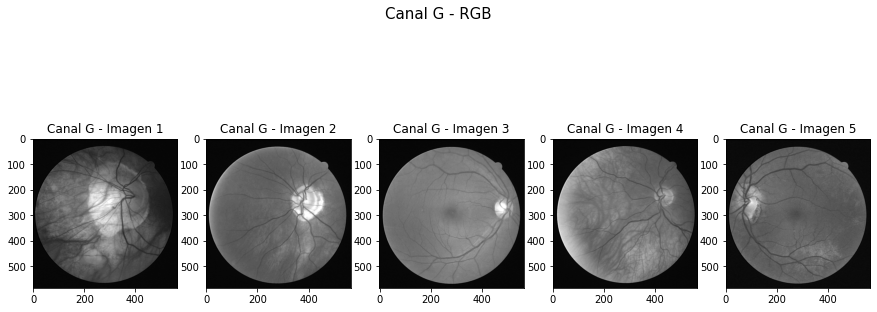

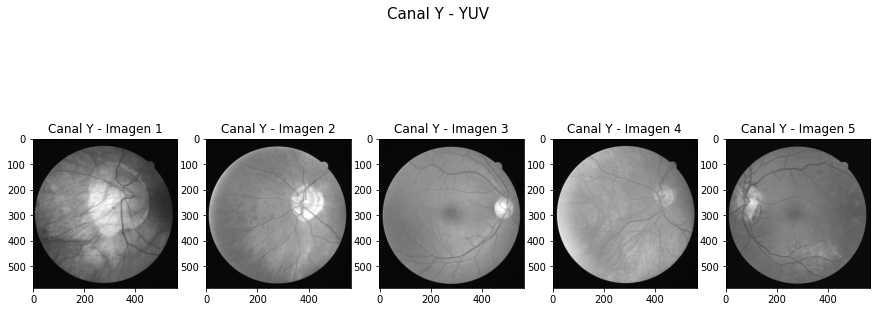

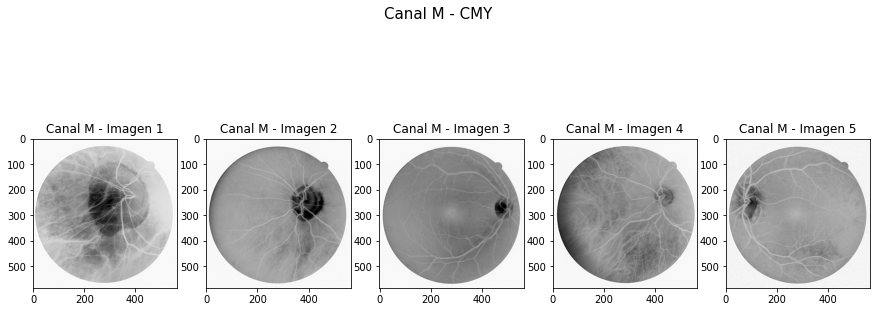

In [56]:
#Leamos estas imagenes representativas para compararlas

imagen1 = img_read('images/training/images/34_training.tif')
imagen2 = img_read('images/training/images/31_training.tif')
imagen3 = img_read('images/training/images/38_training.tif')
imagen4 = img_read('images/training/images/23_training.tif')
imagen5 = img_read('images/training/images/26_training.tif')

imagen1yuv = img_read('images/training/images/34_training.tif',mode="yuv")
imagen2yuv = img_read('images/training/images/31_training.tif',mode="yuv")
imagen3yuv = img_read('images/training/images/38_training.tif',mode="yuv")
imagen4yuv = img_read('images/training/images/23_training.tif',mode="yuv")
imagen5yuv = img_read('images/training/images/26_training.tif',mode="yuv")

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize=(15, 6))
fig.suptitle('Canal G - RGB', fontsize=15)
ax1.set_title('Canal G - Imagen 1')
ax1.imshow(imagen1[:,:,1], cmap='gray')
ax2.set_title('Canal G - Imagen 2')
ax2.imshow(imagen2[:,:,1], cmap='gray')
ax3.set_title('Canal G - Imagen 3')
ax3.imshow(imagen3[:,:,1], cmap='gray')
ax4.set_title('Canal G - Imagen 4')
ax4.imshow(imagen4[:,:,1], cmap='gray')
ax5.set_title('Canal G - Imagen 5')
ax5.imshow(imagen5[:,:,1], cmap='gray')

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize=(15, 6))
fig.suptitle('Canal Y - YUV', fontsize=15)
ax1.set_title('Canal Y - Imagen 1')
ax1.imshow(imagen1yuv[:,:,0], cmap='gray')
ax2.set_title('Canal Y - Imagen 2')
ax2.imshow(imagen2yuv[:,:,0], cmap='gray')
ax3.set_title('Canal Y - Imagen 3')
ax3.imshow(imagen3yuv[:,:,0], cmap='gray')
ax4.set_title('Canal Y - Imagen 4')
ax4.imshow(imagen4yuv[:,:,0], cmap='gray')
ax5.set_title('Canal Y - Imagen 5')
ax5.imshow(imagen5yuv[:,:,0], cmap='gray')

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize=(15, 6))
fig.suptitle('Canal M - CMY', fontsize=15)
ax1.set_title('Canal M - Imagen 1')
ax1.imshow(255 - imagen1[:,:,1], cmap='gray')
ax2.set_title('Canal M - Imagen 2')
ax2.imshow(255 - imagen2[:,:,1], cmap='gray')
ax3.set_title('Canal M - Imagen 3')
ax3.imshow(255 - imagen3[:,:,1], cmap='gray')
ax4.set_title('Canal M - Imagen 4')
ax4.imshow(255 - imagen4[:,:,1], cmap='gray')
ax5.set_title('Canal M - Imagen 5')
ax5.imshow(255 - imagen5[:,:,1], cmap='gray')


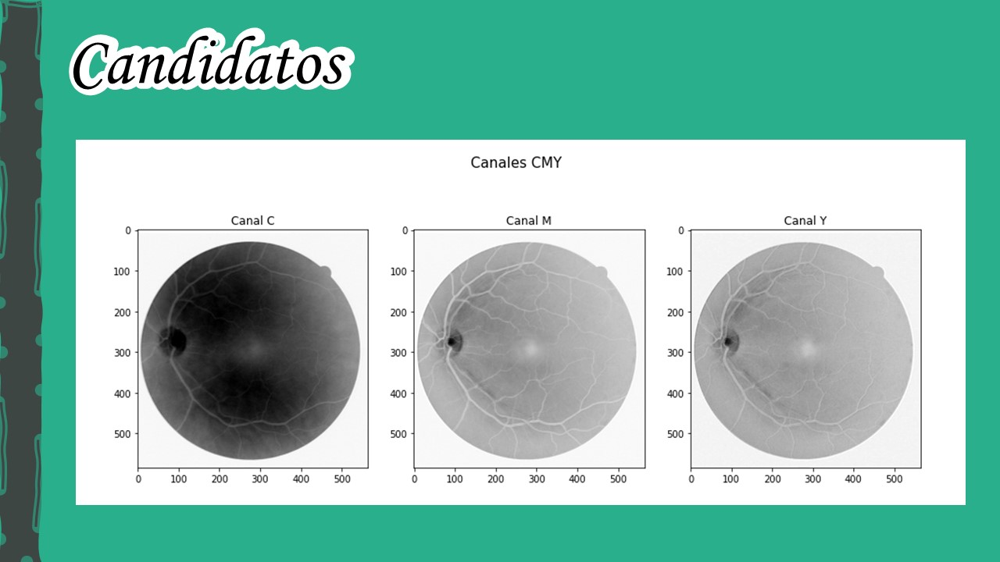

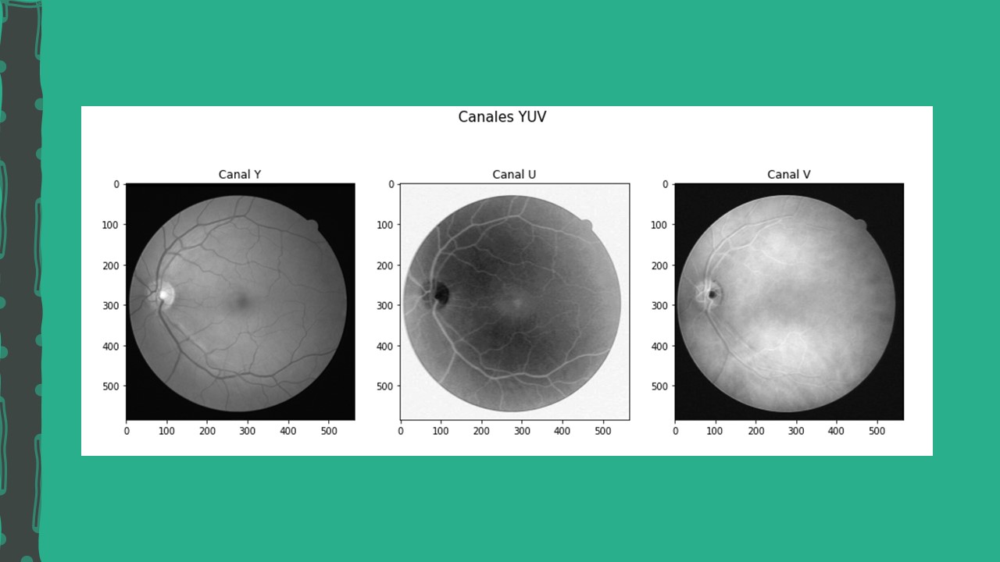

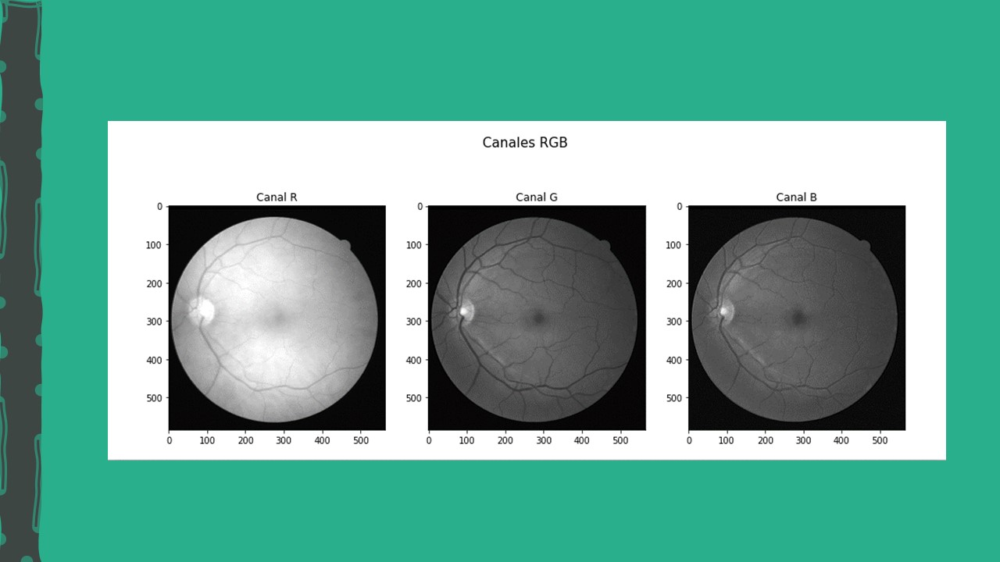

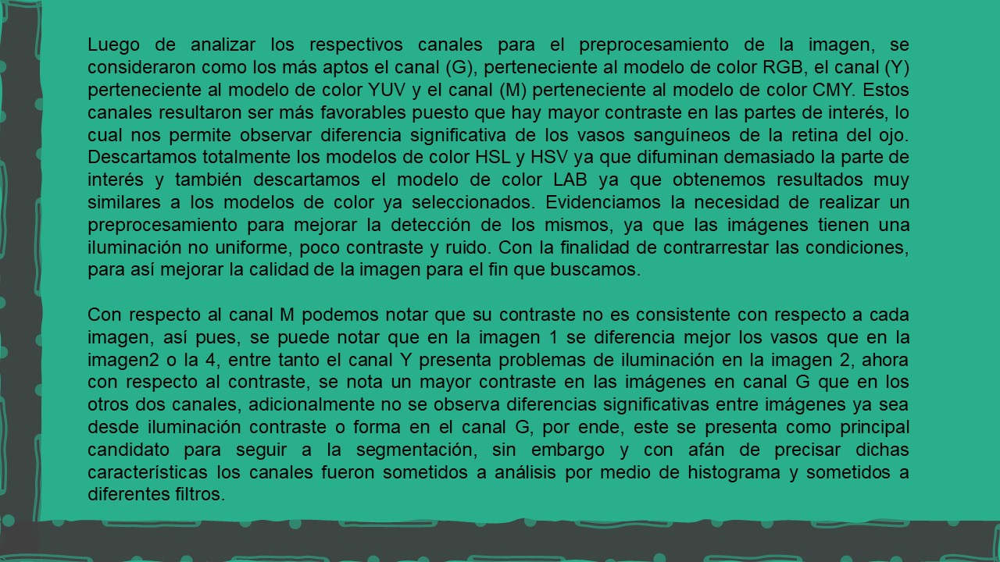

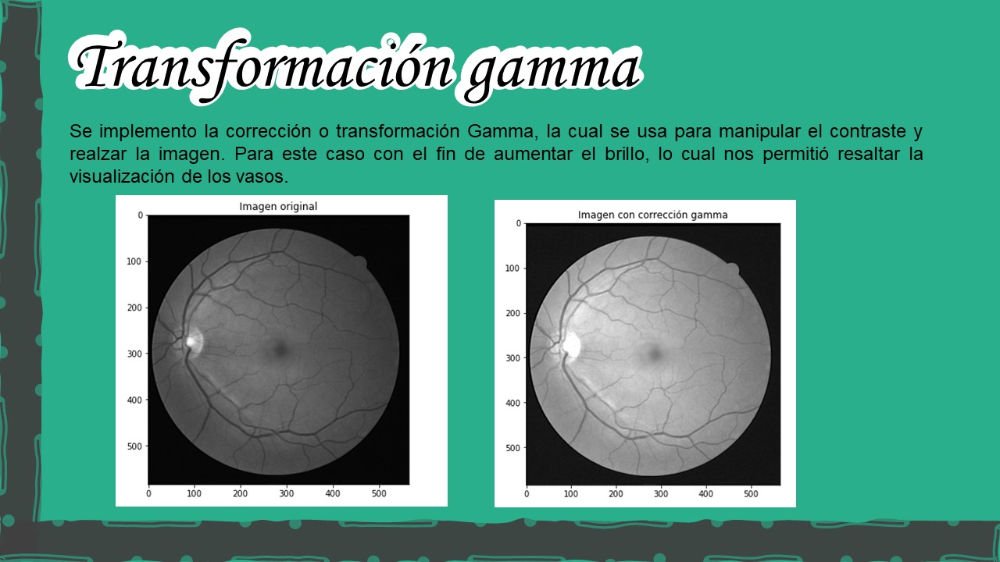

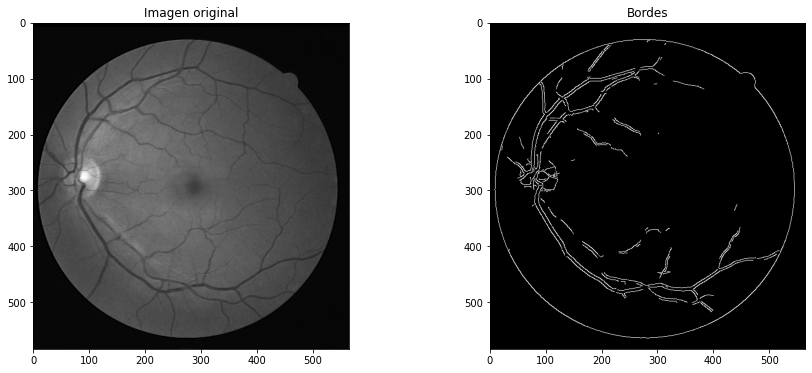

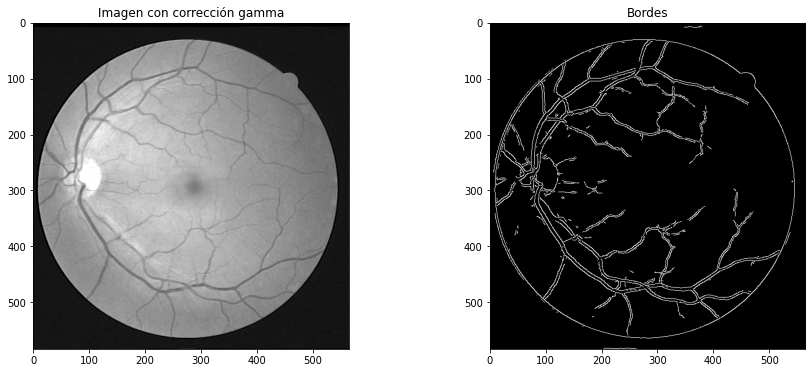

In [57]:
img_rgb = img_read('images/training/images/35_training.tif')

#Modelo RGB
img_R = img_rgb[:,:,0]
img_G = img_rgb[:,:,1]
img_B = img_rgb[:,:,2]


#Definimos esta función para detectar bordes, la usaremos mas adelante
def detect_edge(image, umbral_min, umbral_max, titulo = "Imagen original",canal = ""):
    image_with_edges = cv2.Canny(image, umbral_min, umbral_max)
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15, 6))
    fig.suptitle(canal, fontsize=15)
    ax1.set_title(titulo)
    ax1.imshow(image, cmap='gray')
    ax2.set_title('Bordes')
    ax2.imshow(image_with_edges, cmap='gray')

#Definir la función de transformación de la imagen (corrección gamma)
def gamma_correction(img, a, gamma):
        
    #Crear copia de la imagen tipo flotante dada la normalización
    img_copy = img.copy().astype(np.float32)/255.0
    #La función corrección gamma es de la forma ax^gamma donde x es la imagen de entrada
    res_gamma = cv2.pow(img_copy, gamma)
    res = cv2.multiply(res_gamma, a)
    
    #Asegurar que la los datos queden entre 0 y 255 y sean uint8
    res[res<0] = 0
    res = res*255.0
    res[res>255] = 255
    
    res = res.astype(np.uint8)
    
    return res

#Leer la imagen de entrada


#Variar los parámetros a y gamma y volver a aplicar la corrección
a = 1.5
gamma = 0.8

res_oscuro = gamma_correction(img_G, a, gamma)

#Usamos nuestra función para observar la diferencia en detección de bordes de la imagen antes y despues de la corrección
detect_edge(img_G, 80, 140)
detect_edge(res_oscuro, 80, 140,"Imagen con corrección gamma")

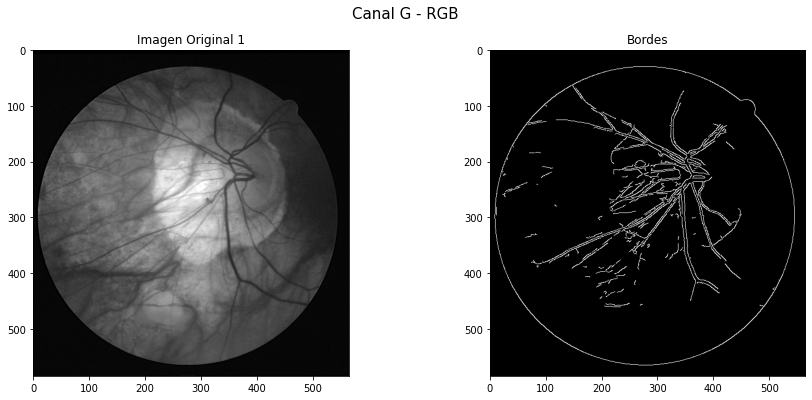

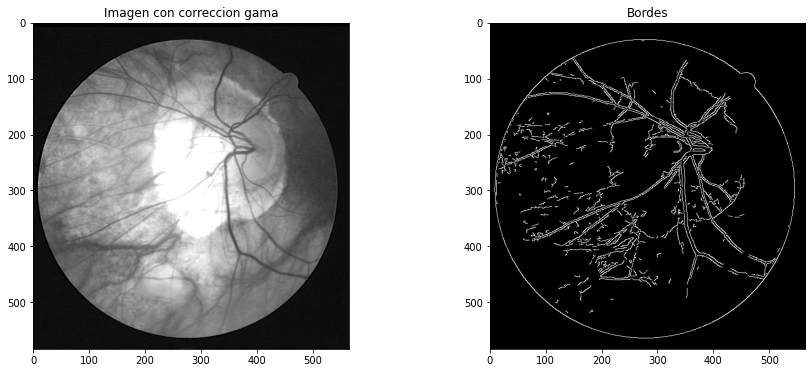

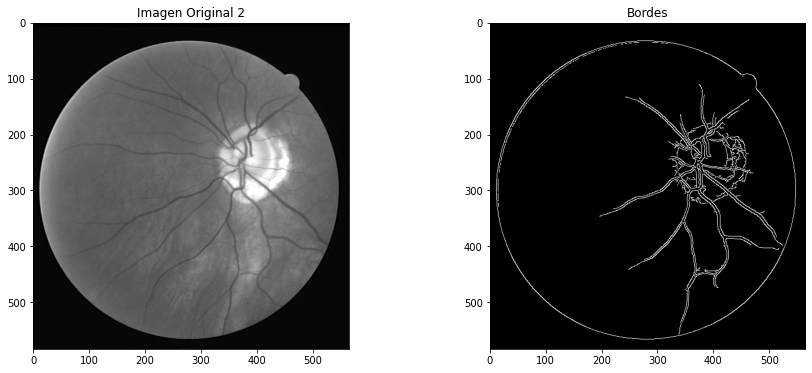

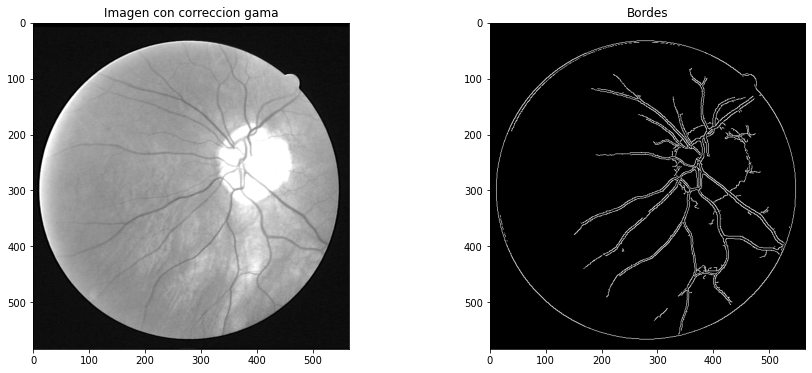

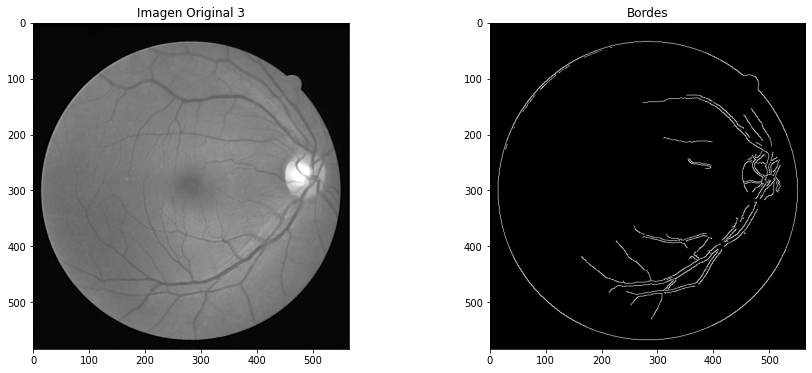

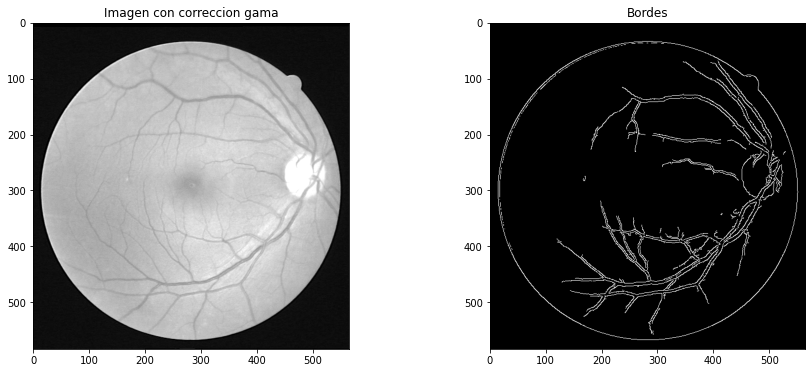

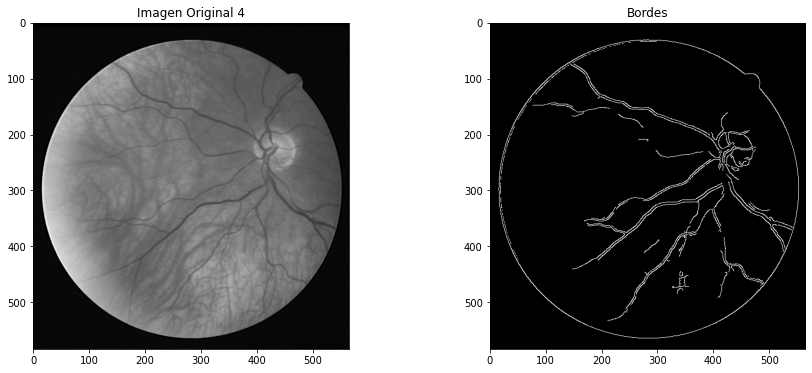

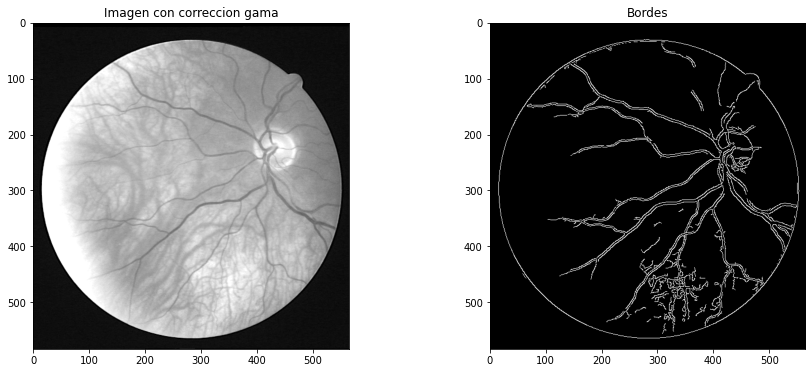

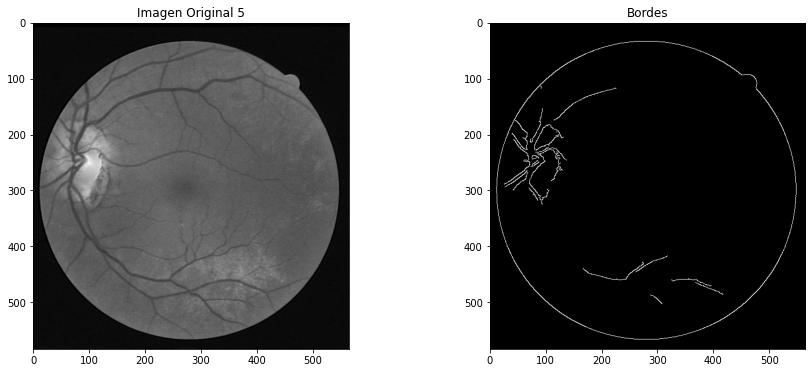

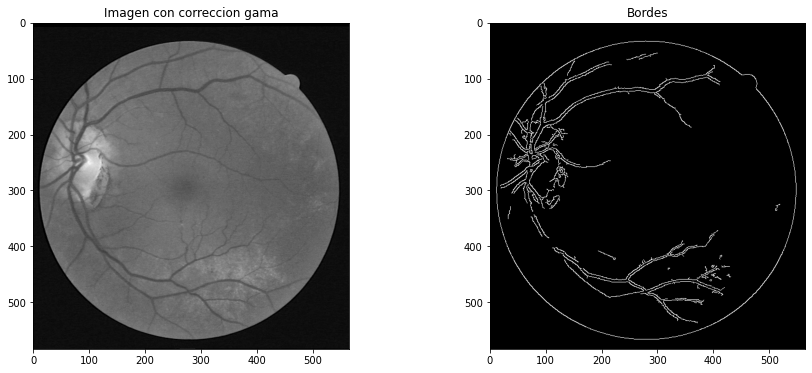

In [58]:
#se varian los valores de a y gama. 
a= 1.45
gamma = 0.9
#CANAL G - RGB
g_imagen1=gamma_correction(imagen1[:,:,1],a,gamma)
g_imagen2=gamma_correction(imagen2[:,:,1],a,gamma)
g_imagen3=gamma_correction(imagen3[:,:,1],a,gamma)
g_imagen4=gamma_correction(imagen4[:,:,1],a,gamma)
g_imagen5=gamma_correction(imagen5[:,:,1],a,gamma)
#CANAL Y - YUV
ay=1.8 #se varian los valores de a y gama.
gammay=0.9
g_imagen1yuv=gamma_correction(imagen1yuv[:,:,1],ay,gammay)
g_imagen2yuv=gamma_correction(imagen2yuv[:,:,1],ay,gammay)
g_imagen3yuv=gamma_correction(imagen3yuv[:,:,1],ay,gammay)
g_imagen4yuv=gamma_correction(imagen4yuv[:,:,1],ay,gammay)
g_imagen5yuv=gamma_correction(imagen5yuv[:,:,1],ay,gammay)
#CANAL M - CMY
am=1.2 #se varian los valores de a y gama.
gammam=1.2
g_imagen1cmy=gamma_correction(255-imagen1[:,:,1],0.9,gammam)
g_imagen2cmy=gamma_correction(255-imagen2[:,:,1],am,gammam)
g_imagen3cmy=gamma_correction(255-imagen3[:,:,1],am,gammam)
g_imagen4cmy=gamma_correction(255-imagen4[:,:,1],am,gammam)
g_imagen5cmy=gamma_correction(255-imagen5[:,:,1],am,gammam)

#DETECCION DE BORDES

#CANAL G - RGB
detect_edge(imagen1[:,:,1],80,140,"Imagen Original 1","Canal G - RGB")
detect_edge(g_imagen1,80,140,"Imagen con correccion gama")
#Imagen 2
detect_edge(imagen2[:,:,1],60,140,"Imagen Original 2")
detect_edge(g_imagen2,60,140,"Imagen con correccion gama")
#imagen 3
detect_edge(imagen3[:,:,1],60,140,"Imagen Original 3")
detect_edge(g_imagen3,60,140,"Imagen con correccion gama")
#imagen 4
detect_edge(imagen4[:,:,1],60,140,"Imagen Original 4")
detect_edge(g_imagen4,60,140,"Imagen con correccion gama")
#imagen 5
detect_edge(imagen5[:,:,1],60,140,"Imagen Original 5")
detect_edge(g_imagen5,60,140,"Imagen con correccion gama")

# #CANAL Y -YUV
# detect_edge(imagen1yuv[:,:,0],60,140,"Imagen Original 1","Canal Y - YUV")
# detect_edge(g_imagen1yuv,10,70,"Imagen con correccion gama")
# #Imagen 2
# detect_edge(imagen2yuv[:,:,0],60,140,"Imagen Original 2")
# detect_edge(g_imagen2yuv,10,70,"Imagen con correccion gama")
# #imagen 3
# detect_edge(imagen3yuv[:,:,0],60,140,"Imagen Original 3")
# detect_edge(g_imagen3yuv,10,70,"Imagen con correccion gama")
# #imagen 4
# detect_edge(imagen4yuv[:,:,0],60,140,"Imagen Original 4")
# detect_edge(g_imagen4yuv,10,70,"Imagen con correccion gama")
# #imagen 5
# detect_edge(imagen5yuv[:,:,0],60,140,"Imagen Original 5")
# detect_edge(g_imagen5yuv,10,70,"Imagen con correccion gama")

# #CANAL M - CMY
# detect_edge(255-imagen1[:,:,1],60,140,"Imagen Original 1","Canal M - CMY")
# detect_edge(g_imagen1cmy,60,140,"Imagen con correccion gama")
# #imagen 2
# detect_edge(255-imagen2[:,:,1],60,140,"Imagen Original 2")
# detect_edge(g_imagen2cmy,60,140,"Imagen con correccion gama")
# #imagen 3
# detect_edge(255-imagen3[:,:,1],60,140,"Imagen Original 3")
# detect_edge(g_imagen3cmy,60,140,"Imagen con correccion gama")
# #imagen 4
# detect_edge(255-imagen4[:,:,1],60,140,"Imagen Original 4")
# detect_edge(g_imagen4cmy,60,140,"Imagen con correccion gama")
# #imagen 5
# detect_edge(255-imagen5[:,:,1],60,140,"Imagen Original 5")
# detect_edge(g_imagen5cmy,60,140,"Imagen con correccion gama")




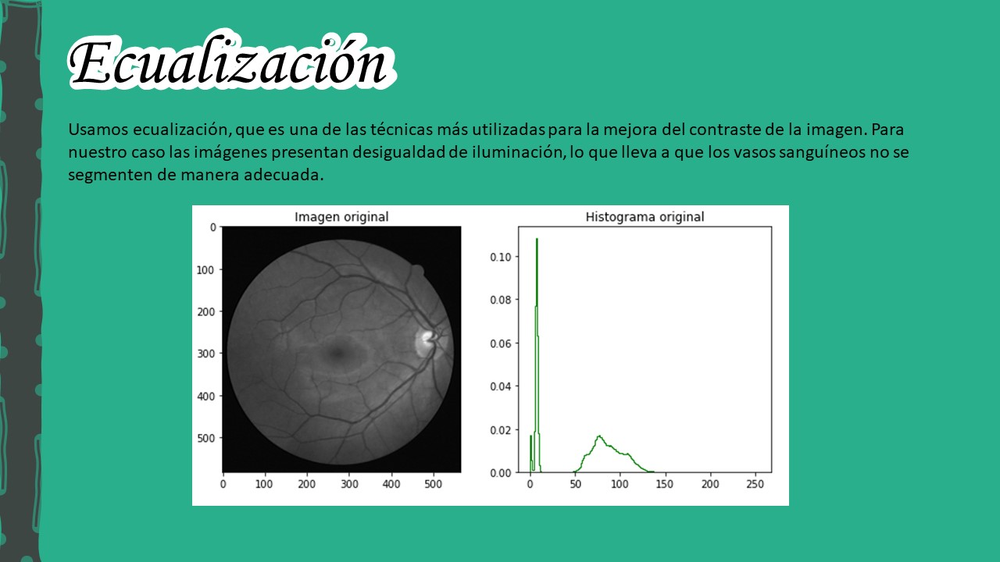

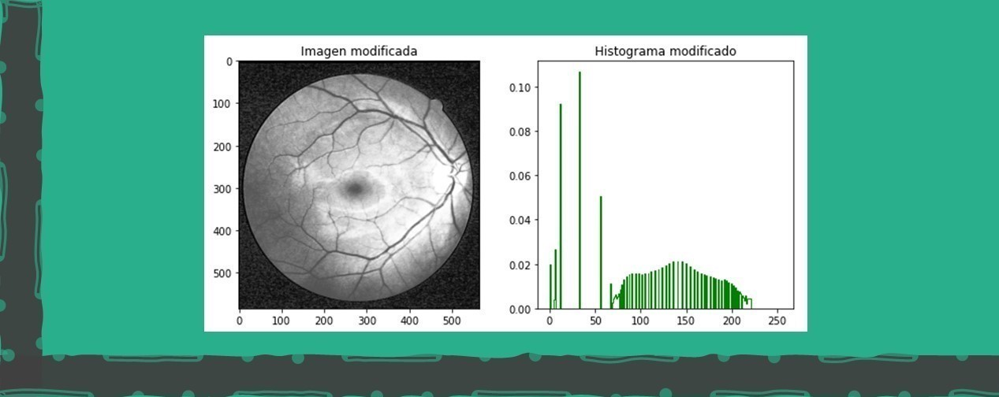

<Figure size 432x288 with 0 Axes>

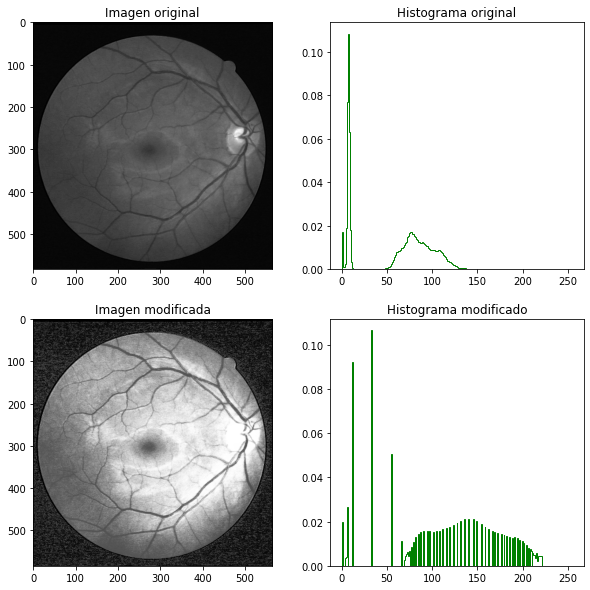

In [59]:
#Definir la función ecualización del histograma cuyo parámetro es una imagen
img_rgb1 = img_read('images/training/images/29_training.tif')
#Modelo RGB
img_G2 = img_rgb1[:,:,1]

def histogram_equalization(img):
         
    #Crear matriz de ceros del tamaño de la imagen y tipo de dato flotante
    res = np.zeros(img.shape, np.float32)
    #Crear un vector 1-D de la matriz de la imagen es decir \aplanarla\
    img_raveled = img.ravel()
    #Generar el histograma normalizado de la imagen 
    hist_norm = plt.hist(img_raveled, bins=255, range=(0.0, 255.0), density=True)
    #Limpiar la figura actual
    plt.clf()
    #hist_norm[0] es un vector de probabilidades. Añadir al vector el valor [1 - sumatoria de sus datos]
    pdf = hist_norm[0]
    np.append(pdf, 1.0 - np.sum(pdf))
    #Dado que se añade un dato se realiza la sumatoria de valores sobre todo el vector
    cdf = [np.sum(pdf[0:x]) for x in range(0,256)]
    #Hallar el valor mínimo y máximo de la imagen
    gmin = np.min(img)
    gmax = np.max(img)
    
    #Generar F(g) - Función de ecualización
    for g in range(0,256):
        res[img == g] = (gmax - gmin)*cdf[g] + gmin
    #Asegurar que los datos sean uint8 y esten en el rango correspondiente
    res[res<0] = 0
    res[res>255] = 255
    res = res.astype(np.uint8)
    return res

#Leer la imagen y aplicar la transformación ecualización del histograma sobre ésta

res_ecua = histogram_equalization(img_G2)

#Generar subplot 2x3 para mostrar imagen histograma y función de densidad acumulada
fig, arreglo_plots = plt.subplots(2,2 ,figsize=(10 ,10))
colors = ('r','g','b')

arreglo_plots[0,0].set_title('Imagen original')
arreglo_plots[0,0].imshow(img_G2, cmap='gray')
arreglo_plots[0,1].set_title('Histograma original')
img_array_i = img_G.ravel()
_=arreglo_plots[0,1].hist(img_array_i,histtype='step', bins=255 ,
                            range=(0.0, 255.0),density=True ,color=colors[1])

arreglo_plots[1,0].set_title('Imagen modificada')
arreglo_plots[1,0].imshow(res_ecua, cmap="gray")
arreglo_plots[1,1].set_title('Histograma modificado')
img_array_i = res_ecua.ravel()
_=arreglo_plots[1,1].hist(img_array_i,histtype='step', bins=255,
                          range=(0.0, 255.0),density=True, color=colors[1])


In [60]:
#funcion para mostrar la ecualizacion de las imagenes
def mostrar_eh(img1,img2,imagen="",canal=""):
    fig, arreglo_plots = plt.subplots(1,4 ,figsize=(20 ,3))
    fig.suptitle(canal,fontsize=16)
    colors = ('r','g','b')

    arreglo_plots[0].set_title(imagen)
    arreglo_plots[0].imshow(img1, cmap='gray')
    arreglo_plots[1].set_title('Histograma original')
    img_array_i = img1.ravel()
    _=arreglo_plots[1].hist(img_array_i,histtype='step', bins=255 ,
                                range=(0.0, 255.0),density=True ,color=colors[1])
    arreglo_plots[2].set_title("Imagen Modificada")
    arreglo_plots[2].imshow(img2, cmap="gray")
    arreglo_plots[3].set_title('Histograma modificado')
    img_array_i = img2.ravel()
    _=arreglo_plots[3].hist(img_array_i,histtype='step', bins=255,
                              range=(0.0, 255.0),density=True, color=colors[1])

<Figure size 432x288 with 0 Axes>

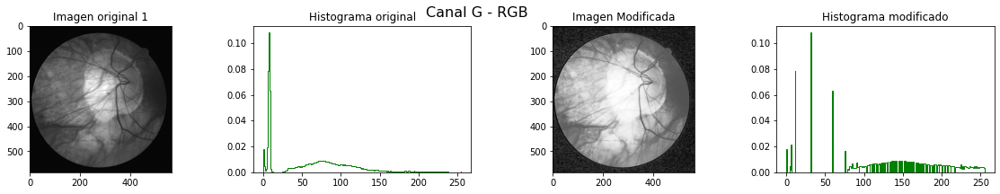

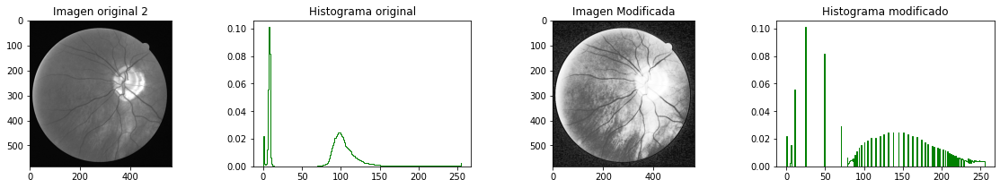

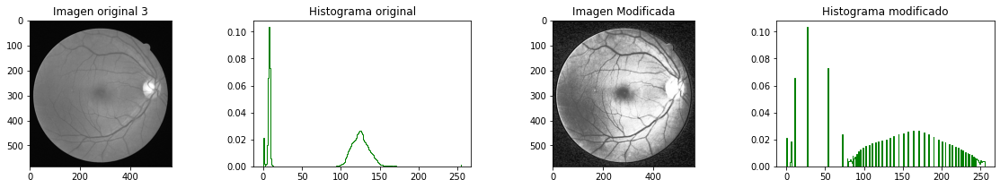

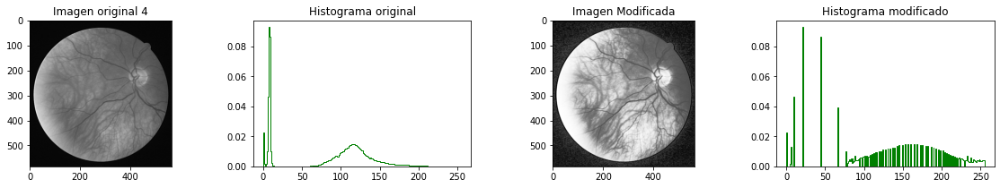

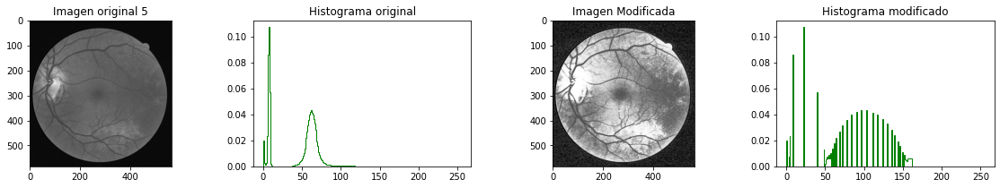

In [61]:
#aplicacion de ecualizacion
#CANAL G - RGB
e_imagen1=histogram_equalization(imagen1[:,:,1])
e_imagen2=histogram_equalization(imagen2[:,:,1])
e_imagen3=histogram_equalization(imagen3[:,:,1])
e_imagen4=histogram_equalization(imagen4[:,:,1])
e_imagen5=histogram_equalization(imagen5[:,:,1])

#CANAL Y -YUV
e_imagen1yuv=histogram_equalization(imagen1yuv[:,:,1])
e_imagen2yuv=histogram_equalization(imagen2yuv[:,:,1])
e_imagen3yuv=histogram_equalization(imagen3yuv[:,:,1])
e_imagen4yuv=histogram_equalization(imagen4yuv[:,:,1])
e_imagen5yuv=histogram_equalization(imagen5yuv[:,:,1])

#CANAL M - CMY
e_imagen1cmy=histogram_equalization(255-imagen1[:,:,1])
e_imagen2cmy=histogram_equalization(255-imagen2[:,:,1])
e_imagen3cmy=histogram_equalization(255-imagen3[:,:,1])
e_imagen4cmy=histogram_equalization(255-imagen4[:,:,1])
e_imagen5cmy=histogram_equalization(255-imagen5[:,:,1])

mostrar_eh(imagen1[:,:,1],e_imagen1,"Imagen original 1","Canal G - RGB"+"\n")
mostrar_eh(imagen2[:,:,1],e_imagen2,"Imagen original 2")
mostrar_eh(imagen3[:,:,1],e_imagen3,"Imagen original 3")
mostrar_eh(imagen4[:,:,1],e_imagen4,"Imagen original 4")
mostrar_eh(imagen5[:,:,1],e_imagen5,"Imagen original 5")

# mostrar_eh(imagen1yuv[:,:,0],e_imagen1yuv,"Imagen original 1","Canal Y - YUV")
# mostrar_eh(imagen2yuv[:,:,0],e_imagen2yuv,"Imagen original 2")
# mostrar_eh(imagen3yuv[:,:,0],e_imagen3yuv,"Imagen original 3")
# mostrar_eh(imagen4yuv[:,:,0],e_imagen4yuv,"Imagen original 4")
# mostrar_eh(imagen5yuv[:,:,0],e_imagen5yuv,"Imagen original 5")

# mostrar_eh(255-imagen1[:,:,1],e_imagen1cmy,"Imagen original 1","Canal M - CMY")
# mostrar_eh(255-imagen2[:,:,1],e_imagen2cmy,"Imagen original 2")
# mostrar_eh(255-imagen3[:,:,1],e_imagen3cmy,"Imagen original 3")
# mostrar_eh(255-imagen4[:,:,1],e_imagen4cmy,"Imagen original 4")
# mostrar_eh(255-imagen5[:,:,1],e_imagen5cmy,"Imagen original 5")



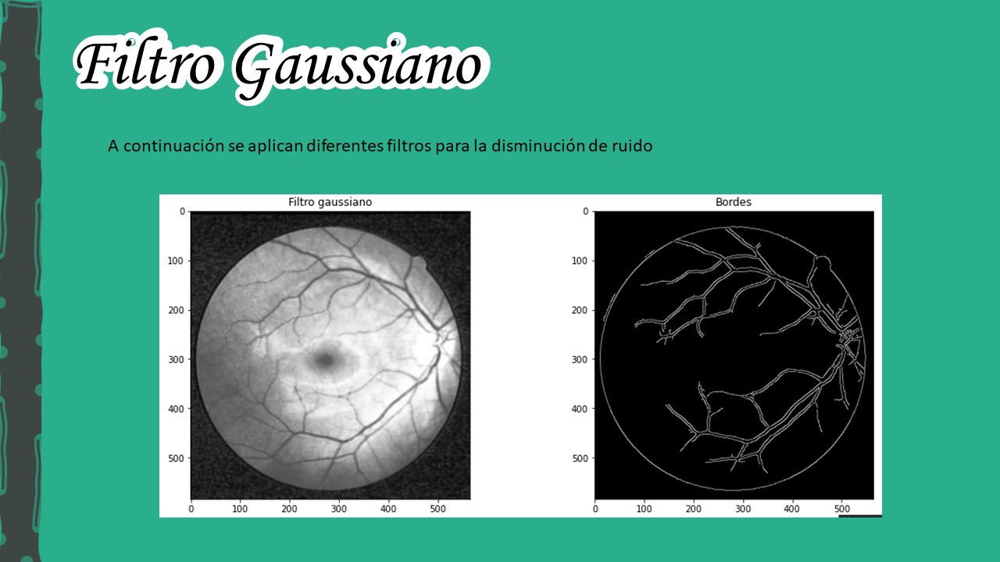

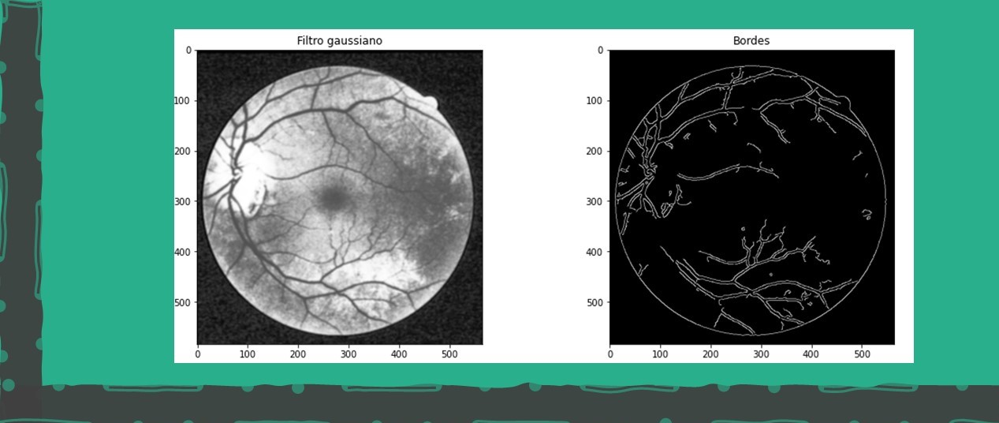

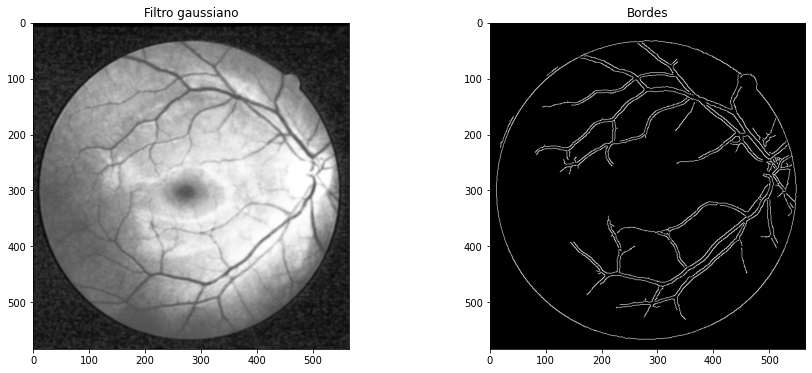

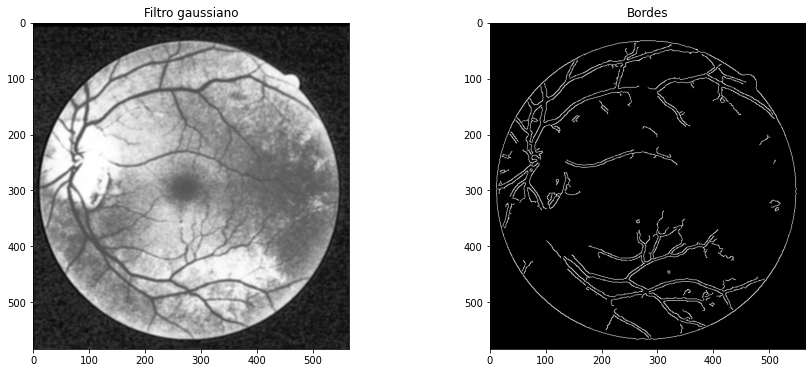

In [62]:
res_gauss= cv2.GaussianBlur(res_ecua,(5, 5),2)
detect_edge(res_gauss, 60, 140, "Filtro gaussiano")

res_gauss2=cv2.GaussianBlur(e_imagen5,(5,5),2)
detect_edge(res_gauss2, 60, 140, "Filtro gaussiano")

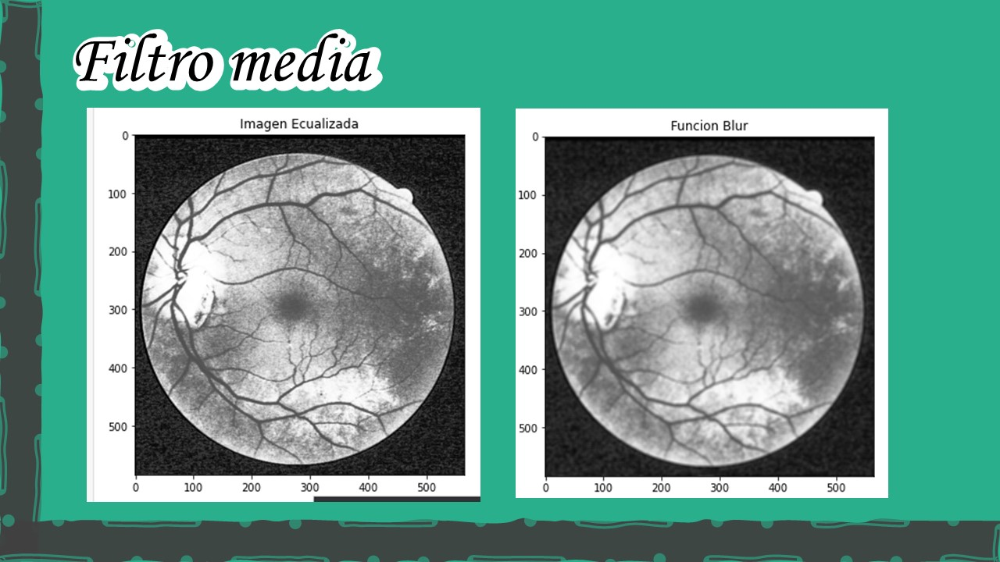

In [63]:
#definicion de funcion para la aplicacion del filtro de media.
def filtro_mediab(imag,k_size):
    #Aplica suavizado mediante la funcion blur
    res1 = cv2.blur(imag,(k_size,k_size),borderType=cv2.BORDER_REPLICATE )
    
    return res1

def filtro_media2d(imag,k_size):
    #Aplica suavizado mediante filter2D
    kernel = np.ones((k_size,k_size),np.float64)/(k_size**2)
    res2 = cv2.filter2D(imag, ddepth=-1, kernel= kernel, borderType=cv2.BORDER_REPLICATE)
    
    return res2

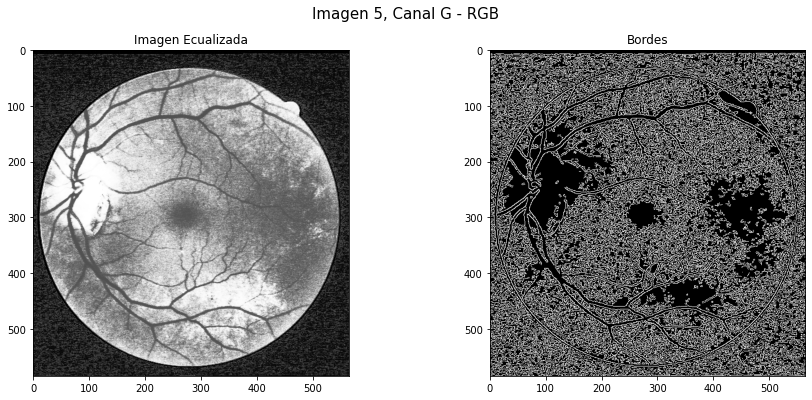

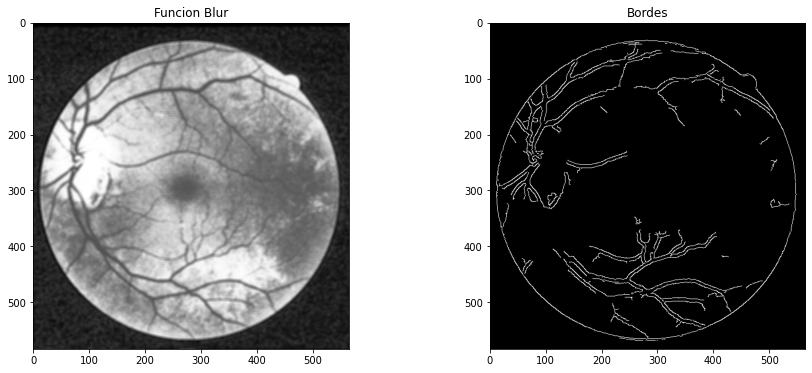

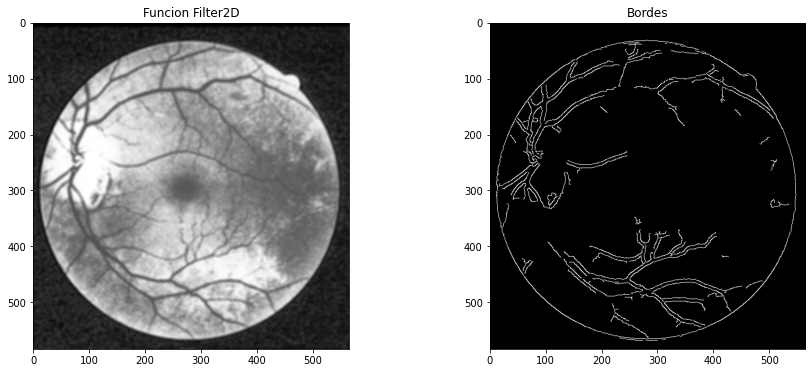

In [64]:
k_size=6 #valor tamaño del kernel
#CANAL G - RGB
fmb_imagen1,fmd_imagen1 = filtro_mediab(e_imagen1,k_size),filtro_media2d(e_imagen1,k_size) 
fmb_imagen2,fmd_imagen2 = filtro_mediab(e_imagen2,k_size),filtro_media2d(e_imagen2,k_size) 
fmb_imagen3,fmd_imagen3 = filtro_mediab(e_imagen3,k_size),filtro_media2d(e_imagen3,k_size) 
fmb_imagen4,fmd_imagen4 = filtro_mediab(e_imagen4,k_size),filtro_media2d(e_imagen4,k_size) 
#solo se mostro el filtro en la imagen 5
fmb_imagen5,fmd_imagen5 = filtro_mediab(e_imagen5,k_size),filtro_media2d(e_imagen5,k_size) 
detect_edge(e_imagen5, 50, 120, "Imagen Ecualizada", "Imagen 5, Canal G - RGB")
detect_edge(fmb_imagen5, 50, 120, "Funcion Blur")
detect_edge(fmd_imagen5, 50, 120, "Funcion Filter2D")

# #IMAGEN 5 CANAL Y -YUV
# fmb_imagen1y,fmd_imagen1y = filtro_mediab(e_imagen1yuv,k_size),filtro_media2d(e_imagen1yuv,k_size) 
# fmb_imagen2y,fmd_imagen2y = filtro_mediab(e_imagen2yuv,k_size),filtro_media2d(e_imagen2yuv,k_size) 
# fmb_imagen3y,fmd_imagen3y = filtro_mediab(e_imagen3yuv,k_size),filtro_media2d(e_imagen3yuv,k_size) 
# fmb_imagen4y,fmd_imagen4y = filtro_mediab(e_imagen4yuv,k_size),filtro_media2d(e_imagen4yuv,k_size)
# #solo se mostro el filtro en la imagen 5
# fmb_imagen5y,fmd_imagen5y = filtro_mediab(e_imagen5yuv,k_size),filtro_media2d(e_imagen5yuv,k_size) 
# detect_edge(e_imagen5yuv, 20, 50, "Imagen Ecualizada", "Imagen 5, Canal Y - YUV")
# detect_edge(fmb_imagen5y, 20, 50, "Funcion Blur")
# detect_edge(fmd_imagen5y, 20, 50, "Funcion Filter2D")

# #IMAGEN 5 CANAL M - CMY
# fmb_imagen1m,fmd_imagen1m = filtro_mediab(e_imagen1cmy,k_size),filtro_media2d(e_imagen1cmy,k_size) 
# fmb_imagen2m,fmd_imagen2m = filtro_mediab(e_imagen2cmy,k_size),filtro_media2d(e_imagen2cmy,k_size) 
# fmb_imagen3m,fmd_imagen3m = filtro_mediab(e_imagen3cmy,k_size),filtro_media2d(e_imagen3cmy,k_size) 
# fmb_imagen4m,fmd_imagen4m = filtro_mediab(e_imagen4cmy,k_size),filtro_media2d(e_imagen4cmy,k_size) 
# fmb_imagen5m,fmd_imagen5m = filtro_mediab(e_imagen5cmy,k_size),filtro_media2d(e_imagen5cmy,k_size)
# #solo se mostro el filtro en la imagen 5
# detect_edge(e_imagen5cmy, 30, 120, "Imagen Ecualizada", "Imagen 5, Canal M - CMY")
# detect_edge(fmb_imagen5m, 30, 120, "Funcion Blur")
# detect_edge(fmd_imagen5m, 30, 120, "Funcion Filter2D")

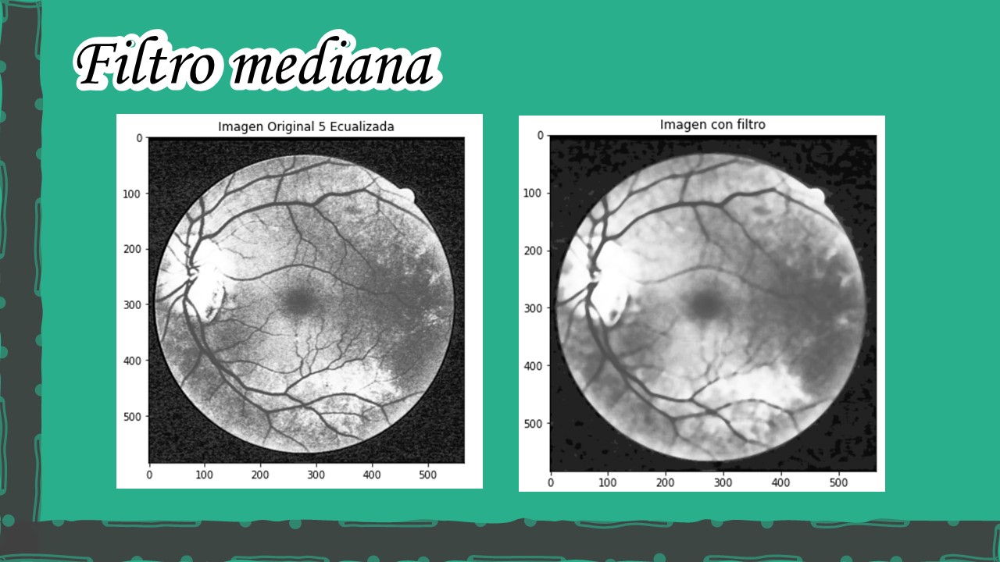

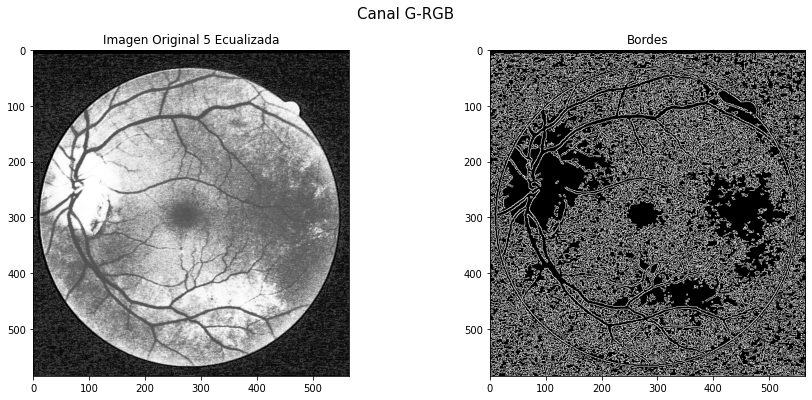

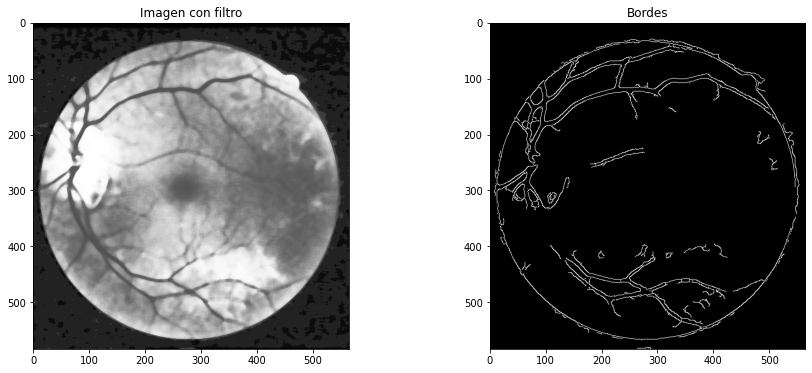

In [65]:
#Definir tamaño del kernel
k_size = 9
#Aplicar filtro de mediana a la imagen de entrada
res1_g= cv2.medianBlur(e_imagen1, k_size)
res2_g= cv2.medianBlur(e_imagen2, k_size)
res3_g= cv2.medianBlur(e_imagen3, k_size)
res4_g= cv2.medianBlur(e_imagen4, k_size)
res5_g= cv2.medianBlur(e_imagen5, k_size)

res1_y= cv2.medianBlur(e_imagen1yuv, k_size)
res2_y= cv2.medianBlur(e_imagen2yuv, k_size)
res3_y= cv2.medianBlur(e_imagen3yuv, k_size)
res4_y= cv2.medianBlur(e_imagen4yuv, k_size)
res5_y= cv2.medianBlur(e_imagen5yuv, k_size)

res1_m= cv2.medianBlur(e_imagen1cmy, k_size)
res2_m= cv2.medianBlur(e_imagen2cmy, k_size)
res3_m= cv2.medianBlur(e_imagen3cmy, k_size)
res4_m= cv2.medianBlur(e_imagen4cmy, k_size)
res5_m= cv2.medianBlur(e_imagen5cmy, k_size)

#Solo se mostro la imagen 5 de cada canal escogido.
detect_edge(e_imagen5,50,130,"Imagen Original 5 Ecualizada","Canal G-RGB")
detect_edge(res5_g,50,130,"Imagen con filtro")

# detect_edge(e_imagen5yuv,10,55,"Imagen Original 5 Ecualizada","Canal Y - YUV")
# detect_edge(res5_y,10,55,"Imagen con filtro")

# detect_edge(e_imagen5cmy,30,140,"Imagen Original 5 Ecualizada","Canal M - CMY")
# detect_edge(res5_m,30,140,"Imagen con filtro")

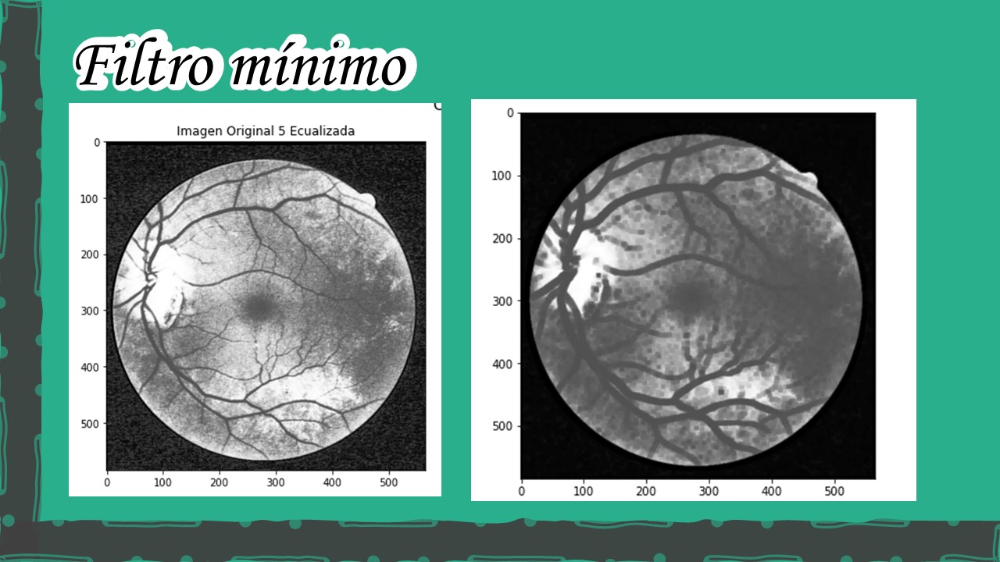 

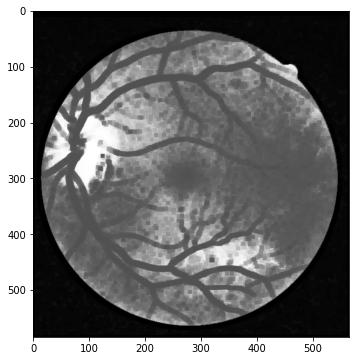

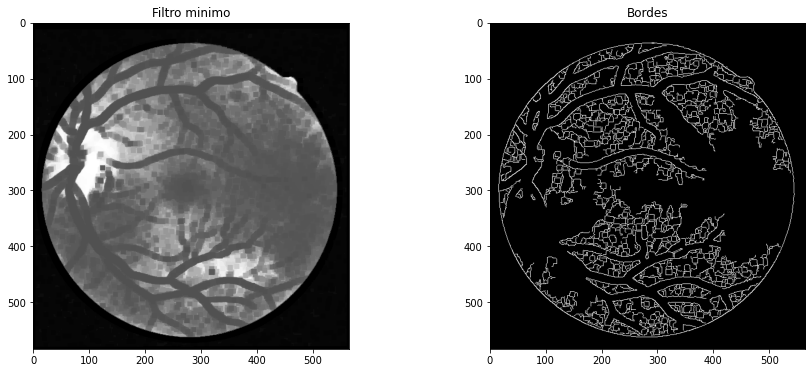

In [66]:
#Definir función filtro del mínimo
def minimum_filter(img,k_size):
    #Crear matriz de ceros del tamaño de imagen de entrada
    res = np.zeros(img.shape, np.uint8)
    #Definir el radio del kernel
    r = math.floor(k_size/2)
    #Recorrer cada posición i,j de la imagen con el kernel
    for i in range(r, img.shape[0]-r):
        for j in range(r, img.shape[1]-r):
            #Tamaño de la ventana 
            window = img[i-r:i+r+1,j-r:j+r+1]
            #Cambiar el valor de la posición i,j de la imagen por el de la ventana
            min_val = np.min(window)
            res[i,j] = min_val
    return res
fig, (ax1) = plt.subplots(1, figsize=(15, 6))

ax1.imshow(minimum_filter(e_imagen5, 6), cmap ='gray')
detect_edge(minimum_filter(e_imagen5, k_size), 10, 120, "Filtro minimo")

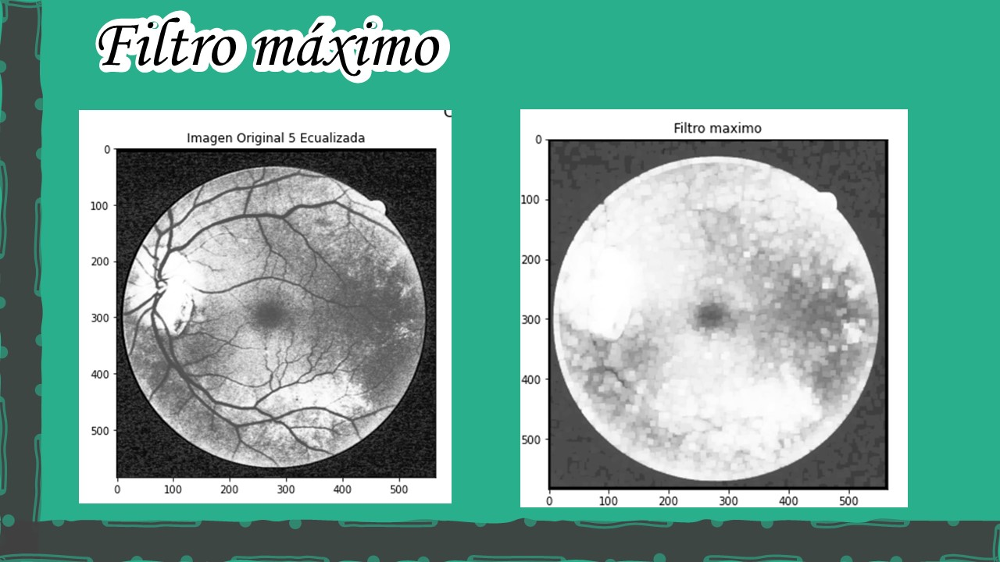

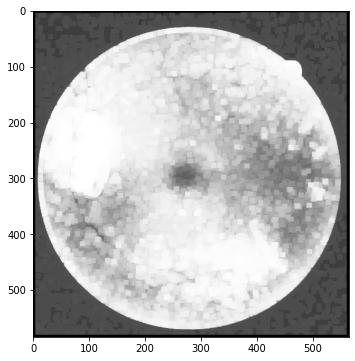

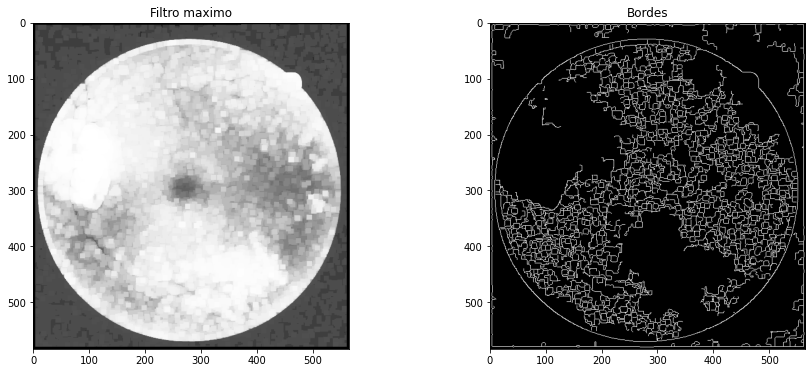

In [67]:
#Definir función de Filtro del Máximo
def maximum_filter(img,k_size):
    #Crear una matriz de ceros del tamaño de la imagen de entrada
    res = np.zeros(img.shape, np.uint8)
    #Radio del kernel
    r = math.floor(k_size/2)
    #Recorrer cada posición i,j de la imagen con el kernel
    for i in range(r, img.shape[0]-r):
        for j in range(r, img.shape[1]-r):
            #Tamaño de la ventana 
            window = img[i-r:i+r+1,j-r:j+r+1]
            #Cambiar el valor de la posición i,j de la imagen por el de la ventana
            max_val = np.max(window)
            res[i,j] = max_val
    return res

fig, (ax1) = plt.subplots(1, figsize=(15, 6))

ax1.imshow(maximum_filter(e_imagen5, k_size), cmap ='gray')
detect_edge(maximum_filter(e_imagen5, k_size), 10, 120, "Filtro maximo")


# Segunda presentación:


<Figure size 432x288 with 0 Axes>

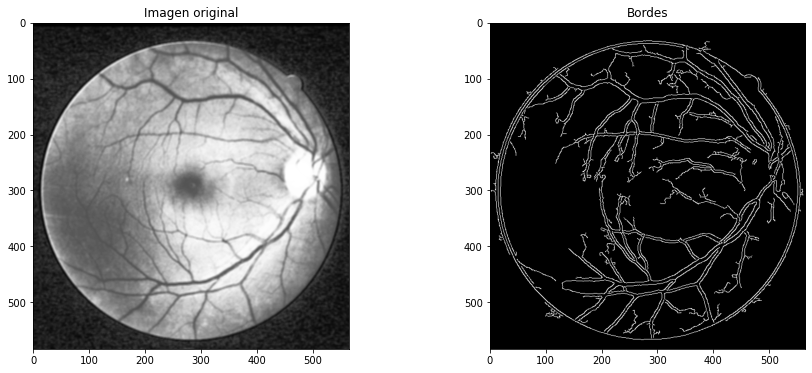

In [68]:
# resumen, funcion de preprocesamiento ecualizacion , multiplicacion y filtro gaussiano en canal g 
def preprocesamiento(img):
    #Tomamos solo el canal G y aplicamos multiplicación
    img_mult = np.zeros(img.shape, np.uint8)
    multiplo = 1.2
    img_mult[:,:,1] = cv2.multiply(img[:,:,1], multiplo)
    img = img_mult[:,:,1]
    
    #Aplicamos la tecnica de ecualización sobre la imagen
    res = np.zeros(img.shape, np.float32)
    img_raveled = img.ravel()
    hist_norm = plt.hist(img_raveled, bins=255, range=(0.0, 255.0), density=True)
    plt.clf()
    pdf = hist_norm[0]
    np.append(pdf, 1.0 - np.sum(pdf))
    cdf = [np.sum(pdf[0:x]) for x in range(0,256)]
    gmin = np.min(img)
    gmax = np.max(img)
    
    for g in range(0,256):
        res[img == g] = (gmax - gmin)*cdf[g] + gmin

    res[res<0] = 0
    res[res>255] = 255
    res = res.astype(np.uint8)

    #Por ultimo aplicamos filtro Gaussiano
    res_final= cv2.GaussianBlur(res,(5, 5),2)
    
    return res_final

detect_edge(preprocesamiento(imagen3), 35, 140)


<Figure size 432x288 with 0 Axes>

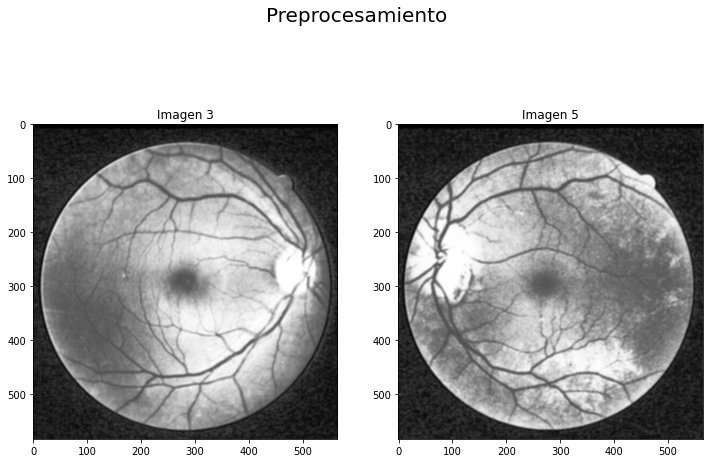

In [69]:
#Muestra de imagenes preprocesadas
imagen3 = img_read('images/training/images/38_training.tif')
imagen5 = img_read('images/training/images/26_training.tif')

img3 = preprocesamiento(imagen3)
img5 = preprocesamiento(imagen5)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 8))
fig.suptitle('Preprocesamiento', fontsize=20)
ax1.set_title('Imagen 3')
ax1.imshow(img3, cmap='gray')
ax2.set_title('Imagen 5')
ax2.imshow(img5, cmap='gray')

# Perfilado y extracción de bordes

Luego de probar los diferentes filtros para el perfilado y extracción de bordes obteniendo unos resultados no favorables con la mayoria al generar un ruido excesivo en las imagenes. Concluimos que la mejor opción es el operador avanzado de extracción de bordes Canny, usando de base el preprocesamiento de imagen resumido en la función anterior (multiplicación, ecualización y filtro gaussiano). A continuación se mostraran algunos resultados.

<Figure size 432x288 with 0 Axes>

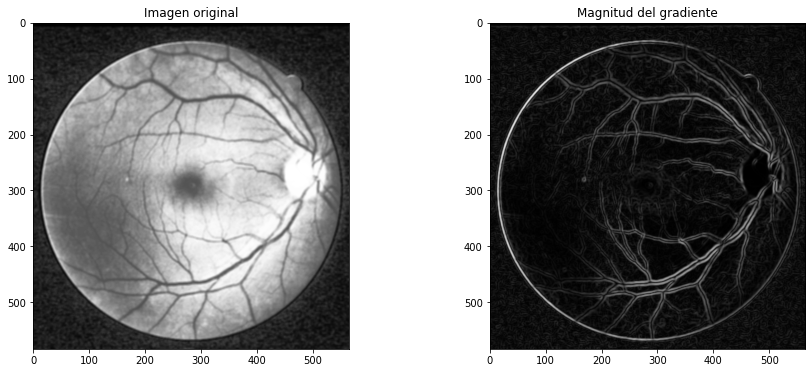

In [70]:
#Filtro de Prewitt (No muestra diferencias significativas, es decir, es muy similar al Filtro Sobel)

def img_scale(img, value_range = [0,255]):
    return (value_range[1] - value_range[0])*(img - np.min(img))/(np.max(img)-np.min(img)) + value_range[0]

def img_trim(img, value_range = [0, 255]):
    res = img.copy()
    res[res > 255] = 255
    res[res < 0] = 0
    return res

#Crear las máscaras del filtro Prewitt
prewitt_x=np.array([[-1,0,1],
                   [-1,0,1],
                   [-1,0,1]],dtype=int)


prewitt_y=np.array([[-1,-1,-1],
                   [0,0,0],
                   [1,1,1]],dtype=int)

#Leer la imagen de entrada y convolucionarla con los dos filtros Prewitt
img = preprocesamiento(imagen3).astype(np.float32)
imgc1 = cv2.filter2D(img, ddepth=-1, kernel=prewitt_x)
imgc2 = cv2.filter2D(img, ddepth=-1, kernel= prewitt_y)

#Calcular la magnitud 
magnitud_prewitt = np.sqrt(np.power(imgc1,2)+np.power(imgc2,2))

#Escalar los datos
magnitud_prewitt = img_scale(magnitud_prewitt)

#Generar un subplot 1x2 para mostrar imagen original y la magnitud del gradiente Prewitt
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15, 6))
ax1.set_title('Imagen original')
ax1.imshow(img, cmap='gray')
ax2.set_title('Magnitud del gradiente')
ax2.imshow((magnitud_prewitt), cmap='gray')


<Figure size 432x288 with 0 Axes>

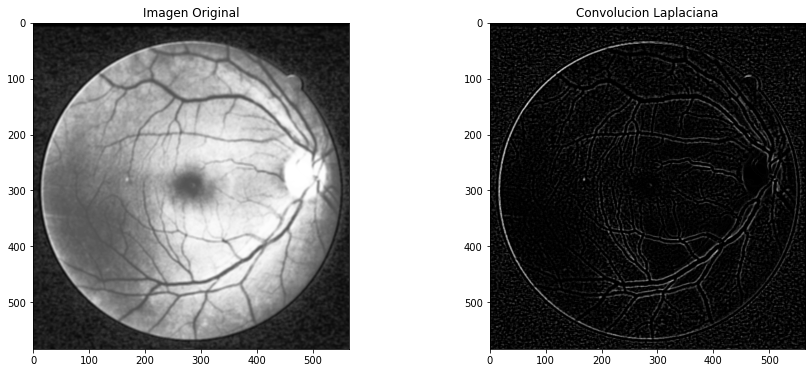

In [71]:
#Filtro de convolución laplaciana
#Leer imagen de entrada
img = preprocesamiento(imagen3)
#Crear la máscara de convolución
mask1 = np.array([[-1,-1,-1],
                 [-1,8,-1],
                 [-1,-1,-1]])

#Realizar la convolución
laplace_filtered = cv2.filter2D(img, ddepth = -1, kernel=mask1)

#Generar subplot 1x2 para mostrar imagen original y convolución Laplaciana
fig, ax = plt.subplots(1,2, figsize=(15, 6))
ax[0].set_title('Imagen Original')
ax[0].imshow(img, cmap='gray')
ax[1].set_title('Convolucion Laplaciana')
ax[1].imshow(laplace_filtered, cmap='gray')

<Figure size 432x288 with 0 Axes>

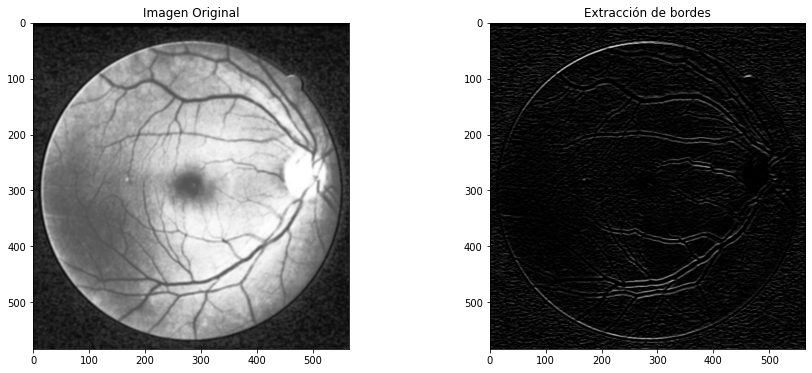

In [72]:
#Convolución para la detección de lineas
#Leer imagen de entrada
img = preprocesamiento(imagen3)
img = img.astype(np.float32)

#Generar una máscara para cada ejemplo de arriba.
mask1 = np.array([[-1,-1,-1],
                  [2,2,2],
                  [-1,-1,-1]], dtype=float)

mask2 = np.array([[-1,2,-1],
                  [-1,2,-1],
                  [-1,2,-1]], dtype=float)

mask3 = np.array([[2,-1,-1],
                  [-1,2,-1],
                  [-1,-1,2]], dtype=float)
mask4 = np.array([[-1,-1,2],
                  [-1,2,-1],
                  [2,-1,-1]], dtype=float)

#Ya que todos los filtros son lineales,  aplicar por separado y luego sumar 
#las imágenes resultantes.

imgf1 = cv2.filter2D(img, ddepth = -1, kernel=mask1)
imgf2 = cv2.filter2D(img, ddepth = -1, kernel=mask2)
imgf3 = cv2.filter2D(img, ddepth = -1, kernel=mask3)
imgf4 = cv2.filter2D(img, ddepth = -1, kernel=mask4)

#Nota: pruebe distintas combinaciones de los valores.

#Sumar los filtros, aplicarle trim para escalar los valores
res = img_scale(imgf1+imgf2+imgf3+imgf4)
res = imgf1
res = img_trim(res)

#Generar subplot 1x2 y mostrar imagen original e imagen con extracción de bordes
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15, 6))
ax1.set_title('Imagen Original')
ax1.imshow(img, cmap='gray')
ax2.set_title('Extracción de bordes')
ax2.imshow(res, cmap='gray') 

### Segmentacion por umbralización

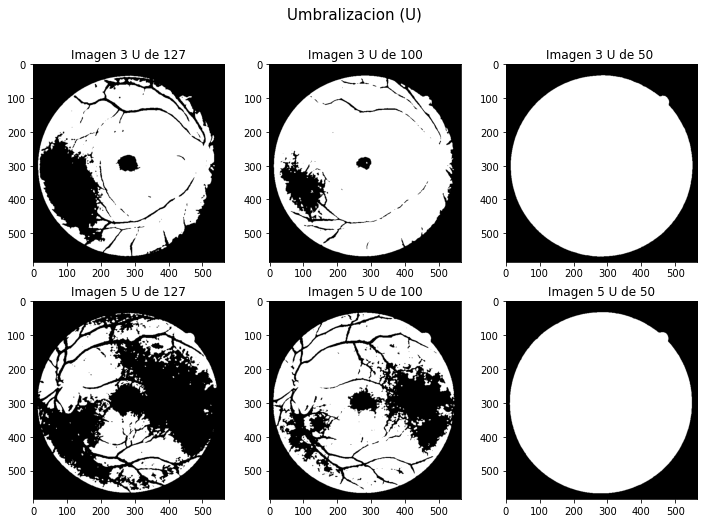

In [73]:
#Realizar disintos threshold a la imagen a partir de distintos valores mínimos
thresholded31 = img3 > 127
thresholded32 = img3 > 100
thresholded33 = img3 > 80
thresholded51 = img5 > 127
thresholded52 = img5 > 100
thresholded53 = img5 > 55

mask3=skimage.img_as_ubyte(thresholded33)
mask5=skimage.img_as_ubyte(thresholded53)

#Generar un subplot 1x3 para mostrar las umbralizaciones y compararlas
fig, ((ax1, ax2, ax3),(ax4,ax5,ax6)) = plt.subplots(2,3, figsize=(12, 8))
fig.suptitle('Umbralizacion (U)', fontsize=15)
ax1.set_title('Imagen 3 U de 127')
ax1.imshow(thresholded31, cmap='gray')
ax2.set_title('Imagen 3 U de 100')
ax2.imshow(thresholded32, cmap='gray')
ax3.set_title('Imagen 3 U de 50 ')
ax3.imshow(thresholded33, cmap='gray')

ax4.set_title('Imagen 5 U de 127')
ax4.imshow(thresholded51, cmap='gray')
ax5.set_title('Imagen 5 U de 100')
ax5.imshow(thresholded52, cmap='gray')
ax6.set_title('Imagen 5 U de 50')
ax6.imshow(thresholded53, cmap='gray')

De esta umbralizacion obtenemos una mascara la cual nos permitira quitar el ruido externo de la retina. A continuacion se aplicara

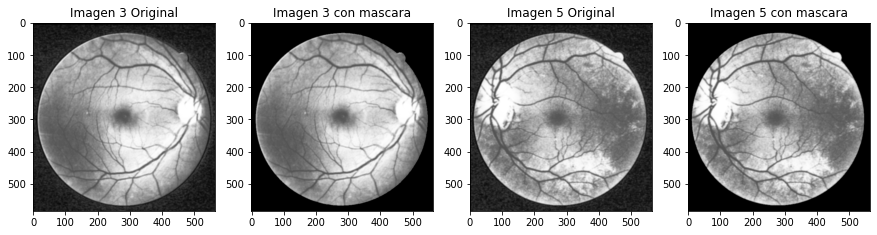

In [74]:
img3m = cv2.bitwise_and(img3,mask3)
img5m = cv2.bitwise_and(img5,mask5)

fig, ax = plt.subplots(1,4, figsize=(15, 6))

ax[0].set_title('Imagen 3 Original')
ax[0].imshow(img3, cmap='gray')
ax[1].set_title('Imagen 3 con mascara')
ax[1].imshow(img3m, cmap = "gray")
ax[2].set_title('Imagen 5 Original')
ax[2].imshow(img5, cmap='gray')
ax[3].set_title('Imagen 5 con mascara')
ax[3].imshow(img5m, cmap='gray')

Desde aqui se empieza aplicar a la imagen con mascara. 

Aplicacion de los diferentes tipos de umbralizacion

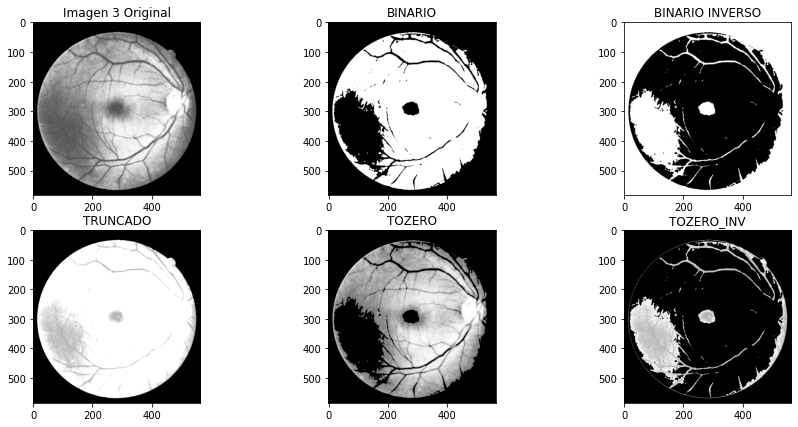

In [75]:
#Definir un valor mínimo
val = 120

#Generar mediante la función threshold de cv2, las distintas aproximaciones que 
#se ofrecen en la figura anterior
#Imagen 3
ret,thresh13 = cv2.threshold(img3m,val,255,cv2.THRESH_BINARY)
ret,thresh23 = cv2.threshold(img3m,val,255,cv2.THRESH_BINARY_INV)
ret,thresh33 = cv2.threshold(img3m,val,255,cv2.THRESH_TRUNC)
ret,thresh43 = cv2.threshold(img3m,val,255,cv2.THRESH_TOZERO)
ret,thresh53 = cv2.threshold(img3m,val,255,cv2.THRESH_TOZERO_INV)

#Dar título a las imágenes y hacer una lista de éstas
# titles = ['Original Image 3','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
# images = [img3m, thresh1, thresh2, thresh3, thresh4, thresh5]

#Generar un subplot 2x3 que muestre todas las umbralizaciones y la imagen original
fig, ax = plt.subplots(2,3, figsize=(15, 7))
ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3m, cmap='gray')
ax[0][1].set_title('BINARIO')
ax[0][1].imshow(thresh13, cmap='gray')
ax[0][2].set_title('BINARIO INVERSO')
ax[0][2].imshow(thresh23, cmap='gray')
ax[1][0].set_title('TRUNCADO')
ax[1][0].imshow(thresh33, cmap='gray')
ax[1][1].set_title('TOZERO')
ax[1][1].imshow(thresh43, cmap='gray')
ax[1][2].set_title('TOZERO_INV')
ax[1][2].imshow(thresh53, cmap='gray')


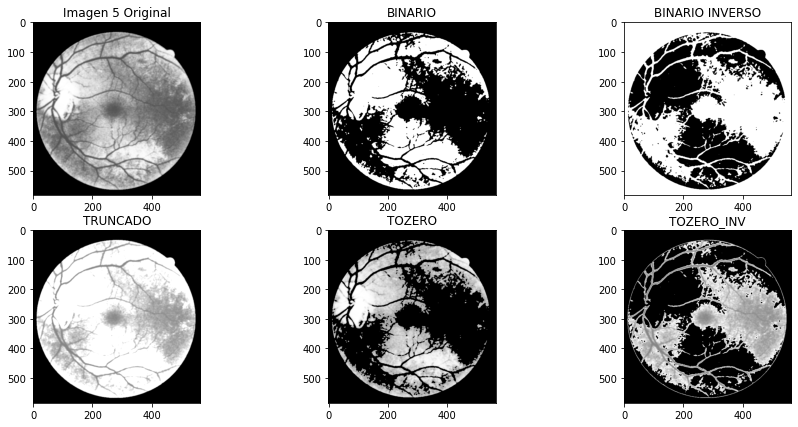

In [76]:
#Imagen 5
ret,thresh15 = cv2.threshold(img5m,val,255,cv2.THRESH_BINARY)
ret,thresh25 = cv2.threshold(img5m,val,255,cv2.THRESH_BINARY_INV)
ret,thresh35 = cv2.threshold(img5m,val,255,cv2.THRESH_TRUNC)
ret,thresh45 = cv2.threshold(img5m,val,255,cv2.THRESH_TOZERO)
ret,thresh55 = cv2.threshold(img5m,val,255,cv2.THRESH_TOZERO_INV)

#Generar un subplot 2x3 que muestre todas las umbralizaciones y la imagen original
fig, ax = plt.subplots(2,3, figsize=(15, 7))
ax[0][0].set_title('Imagen 5 Original')
ax[0][0].imshow(img5m, cmap='gray')
ax[0][1].set_title('BINARIO')
ax[0][1].imshow(thresh15, cmap='gray')
ax[0][2].set_title('BINARIO INVERSO')
ax[0][2].imshow(thresh25, cmap='gray')
ax[1][0].set_title('TRUNCADO')
ax[1][0].imshow(thresh35, cmap='gray')
ax[1][1].set_title('TOZERO')
ax[1][1].imshow(thresh45, cmap='gray')
ax[1][2].set_title('TOZERO_INV')
ax[1][2].imshow(thresh55, cmap='gray')

### Multi-umbralización

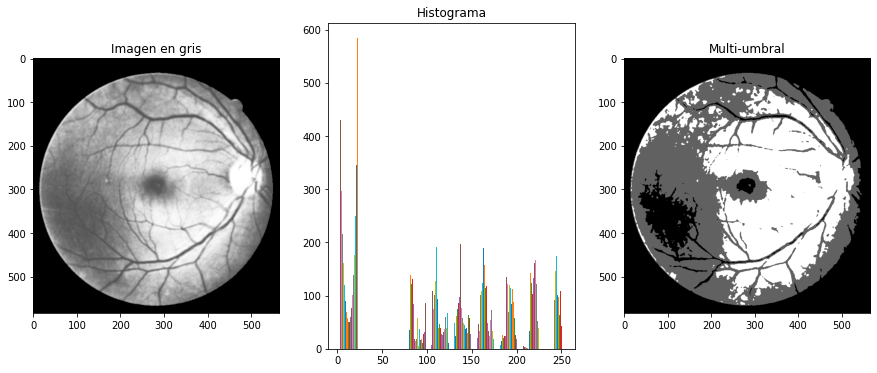

In [77]:
#Crear una copia de la imagen
res = img3m.copy()
#Asignar para todos los valores menores a 100 el valor 75
res[res < 100 ] = 50
#Asignar para avalores entre 100 y 175 el valor 128
res[(res >= 100) & (res < 175)] = 128
#Asignar para cualquier valor mayor a 175 el valor 255
res[res >= 175] = 255


#Generar un subplot 1x3 que muestre imagen en gris, histograma y multi-umbralización
fig, ax = plt.subplots(1,3, figsize=(15, 6))

ax[0].set_title('Imagen en gris')
ax[0].imshow(img3m, cmap='gray')
ax[1].set_title('Histograma')
ax[1].hist(img3m)
ax[2].set_title('Multi-umbral')
ax[2].imshow(res, cmap='gray')

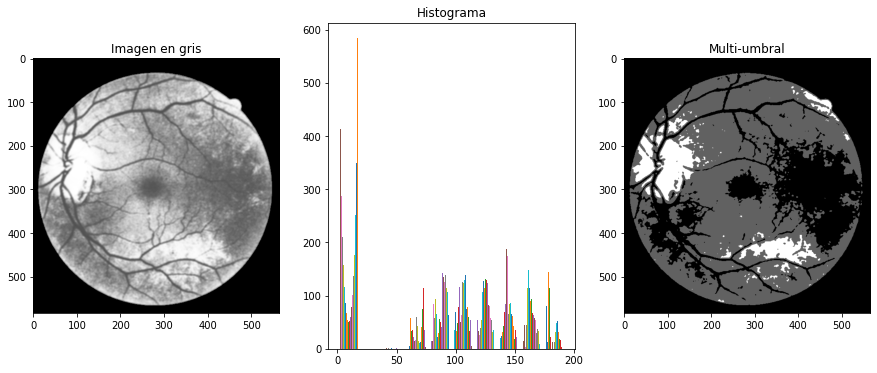

In [78]:
#Imagen 5
res = img5m.copy()
#Asignar para todos los valores menores a 100 el valor 75
res[res < 100 ] = 50
#Asignar para avalores entre 100 y 175 el valor 128
res[(res >= 100) & (res < 175)] = 128
#Asignar para cualquier valor mayor a 175 el valor 255
res[res >= 175] = 255

#Generar un subplot 1x3 que muestre imagen en gris, histograma y multi-umbralización
fig, ax = plt.subplots(1,3, figsize=(15, 6))

ax[0].set_title('Imagen en gris')
ax[0].imshow(img5m, cmap='gray')
ax[1].set_title('Histograma')
ax[1].hist(img5m)
ax[2].set_title('Multi-umbral')
ax[2].imshow(res, cmap='gray')

### Umbralización adaptativa

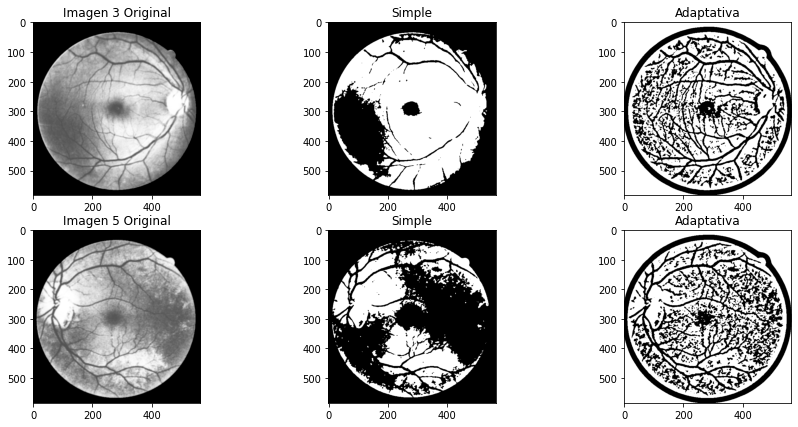

In [79]:
#Realizar una umbralización para valores entre 127 y 255 de la imagen, binaria
ret,th13 = cv2.threshold(img3m,127,255,cv2.THRESH_BINARY)

#Realizar una umbralización adaptativa de tipo Gaussiana
th23 = cv2.adaptiveThreshold(img3m,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,51,2)

#Imagen 5
#Realizar una umbralización para valores entre 127 y 255 de la imagen, binaria
ret,th15 = cv2.threshold(img5m,127,255,cv2.THRESH_BINARY)

#Realizar una umbralización adaptativa de tipo Gaussiana
th25 = cv2.adaptiveThreshold(img5m,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,51,2)

fig, ax = plt.subplots(2,3, figsize=(15, 7))
ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3m, cmap='gray')
ax[0][1].set_title('Simple')
ax[0][1].imshow(th13, cmap='gray')
ax[0][2].set_title('Adaptativa')
ax[0][2].imshow(th23, cmap='gray')
ax[1][0].set_title('Imagen 5 Original')
ax[1][0].imshow(img5m, cmap='gray')
ax[1][1].set_title('Simple')
ax[1][1].imshow(th15, cmap='gray')
ax[1][2].set_title('Adaptativa')
ax[1][2].imshow(th25, cmap='gray')

### Umbralizacion Otsu

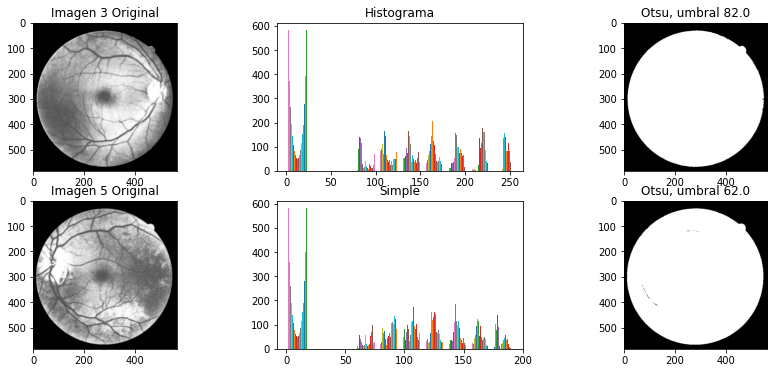

In [80]:
#Realizar una umbralización Otsu y asignar valroes entre 0 y 255 con umbral 119.0
ret13,th13 = cv2.threshold(img3m,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

#Imagen 5
ret15,th15 = cv2.threshold(img5m,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

#Generar un subplot 1x3 que muestre imagen en gris, histograma y Umbralización Otsu
fig, ax = plt.subplots(2,3, figsize=(15, 6))

ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3m, cmap='gray')
ax[0][1].set_title('Histograma')
ax[0][1].hist(img3m)
ax[0][2].set_title('Otsu, umbral ' + str(ret13))
ax[0][2].imshow(th13, cmap='gray')
ax[1][0].set_title('Imagen 5 Original')
ax[1][0].imshow(img5m, cmap='gray')
ax[1][1].set_title('Simple')
ax[1][1].hist(img5m)
ax[1][2].set_title('Otsu, umbral ' + str(ret15))
ax[1][2].imshow(th15, cmap='gray')

## Segmentacion por regiones

### K-Medias
Se utilizo la imagen original, sin seleccion de canal, la imagen a color.

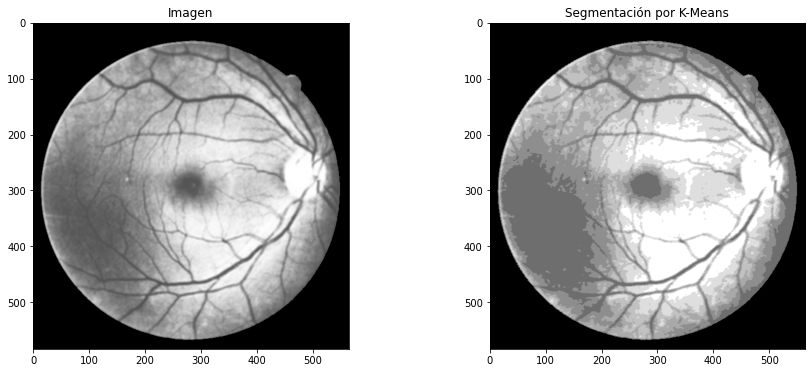

In [81]:
#Reorganizar la imagen de entrada y darle unidades flotantes
Z = img3m.reshape((-1,2))
Z = np.float32(Z)

# definir criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 8
ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

#Volver a tipo de dato uint8 y mostrar la imagen
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img3m.shape))

#Generar un subplot 1x2 y mostrar imagen junto a segmentación por K-means
fig, ax = plt.subplots(1,2, figsize=(15, 6))

ax[0].set_title('Imagen')
ax[0].imshow(img3m, cmap='gray')
ax[1].set_title('Segmentación por K-Means')
ax[1].imshow(res2, cmap='gray')


## Segmentación Watershed

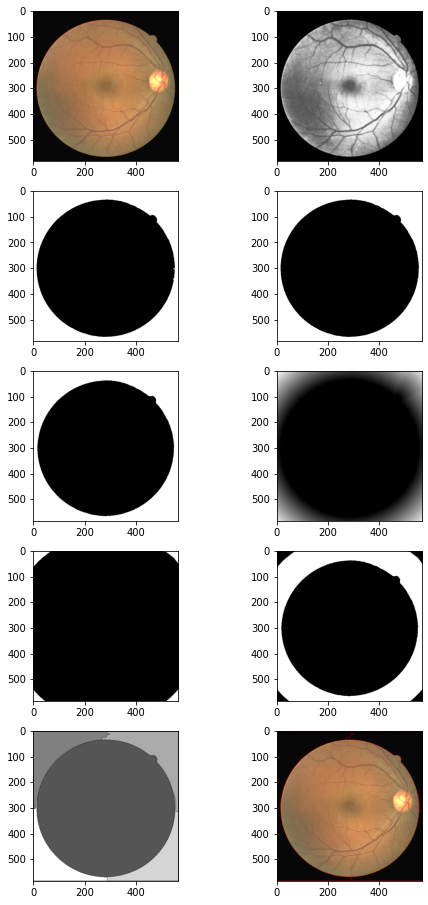

In [82]:
#Importar librerías
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import copy

#Leer imagen de entrada y convertirla a escala de grises
img = img_read('images/training/images/38_training.tif')
gray = img3m

#Aplicar una umbralización OTSU
ret, thresh = cv.threshold(gray,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)

#noise removal
kernel = np.ones((3,3),np.uint8)
opening = cv.morphologyEx(thresh,cv.MORPH_OPEN,kernel, iterations = 2)
# sure background area
sure_bg = cv.dilate(opening,kernel,iterations=3)
# Finding sure foreground area
dist_transform = cv.distanceTransform(opening,cv.DIST_L2,5)
ret, sure_fg = cv.threshold(dist_transform,0.7*dist_transform.max(),255,0)
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg,sure_fg)

# Marker labelling
ret, markers = cv.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

markers = cv2.watershed(img,markers)
final=copy.deepcopy(img)
final[markers == -1] = [255,0,0]


images = [img, gray, thresh,opening,sure_bg,dist_transform,sure_fg,unknown,markers,final]

fig, ax = plt.subplots(5,2, figsize=(8, 16))

ax[0][0].imshow(img, cmap='gray')
ax[0][1].imshow(gray, cmap='gray')
ax[1][0].imshow(thresh, cmap='gray')
ax[1][1].imshow(opening, cmap='gray')
ax[2][0].imshow(sure_bg, cmap='gray')
ax[2][1].imshow(dist_transform, cmap='gray')
ax[3][0].imshow(sure_fg, cmap='gray')
ax[3][1].imshow(unknown, cmap='gray')
ax[4][0].imshow(markers, cmap='gray')
ax[4][1].imshow(final, cmap='gray')

Despues de probar todas las segmentaciones vistas en los notebooks, la que nos proporciona un mejor resultado en la segmentación por medio de extracción de bordes haciendo uso de la función Canny proporcionada por la libreria OpenCV.

### Segmentación por algoritmo Watershed

c:\users\usser\appdata\local\programs\python\python38\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


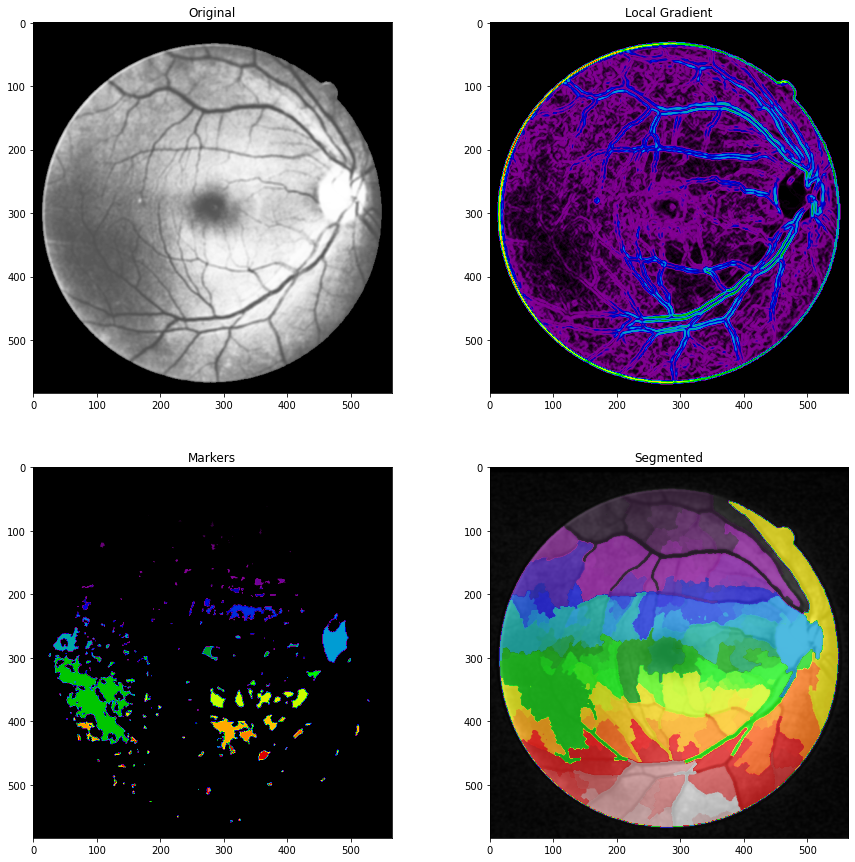

In [83]:
from scipy import ndimage as ndi
import matplotlib.pyplot as plt
from skimage.morphology import watershed, disk
from skimage import data
from skimage.filters import rank
from skimage.util import img_as_ubyte
denoised = rank.median(img3m, disk(2))

# find continuous region (low gradient -
# where less than 10 for this image) --> markers
# disk(5) is used here to get a more smooth image
markers = rank.gradient(denoised, disk(5)) < 10
markers = ndi.label(markers)[0]

# local gradient (disk(2) is used to keep edges thin)
gradient = rank.gradient(denoised, disk(2))

# process the watershed
labels = watershed(gradient, markers)

# display results
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))
ax = axes.ravel()

ax[0].imshow(img3m, cmap=plt.cm.gray)
ax[0].set_title("Original")

ax[1].imshow(gradient, cmap=plt.cm.nipy_spectral)
ax[1].set_title("Local Gradient")

ax[2].imshow(markers, cmap=plt.cm.nipy_spectral)
ax[2].set_title("Markers")

ax[3].imshow(img3, cmap=plt.cm.gray)
ax[3].imshow(labels, cmap=plt.cm.nipy_spectral, alpha=.7)
ax[3].set_title("Segmented")

for a in ax:
    a.axis('on')

plt.show()

### Transformación Top-Hat

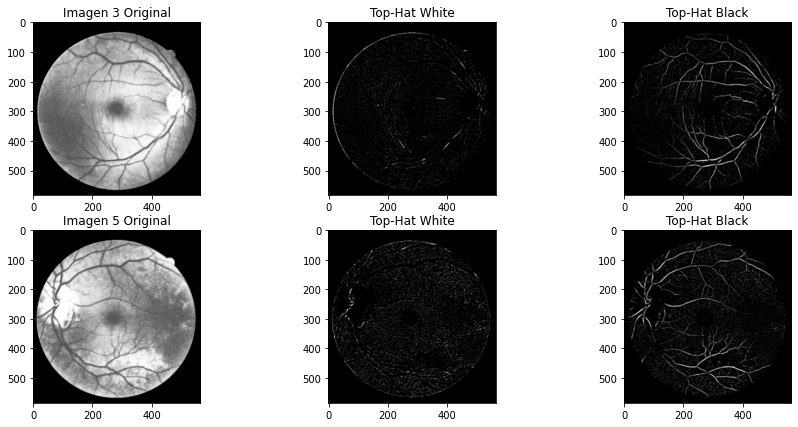

In [84]:
selem = morph.disk(3)
thw3 = morph.white_tophat(img3m, selem)
thb3 = morph.black_tophat(img3m, selem)
#Imagen 5
thw5 = morph.white_tophat(img5m, selem)
thb5 = morph.black_tophat(img5m, selem)

fig, ax = plt.subplots(2,3, figsize=(15, 7))
ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3m, cmap='gray')
ax[0][1].set_title('Top-Hat White')
ax[0][1].imshow(thw3, cmap='gray')
ax[0][2].set_title('Top-Hat Black')
ax[0][2].imshow(thb3, cmap='gray')
ax[1][0].set_title('Imagen 5 Original')
ax[1][0].imshow(img5m, cmap='gray')
ax[1][1].set_title('Top-Hat White')
ax[1][1].imshow(thw5, cmap='gray')
ax[1][2].set_title('Top-Hat Black')
ax[1][2].imshow(thb5, cmap='gray')

<Figure size 432x288 with 0 Axes>

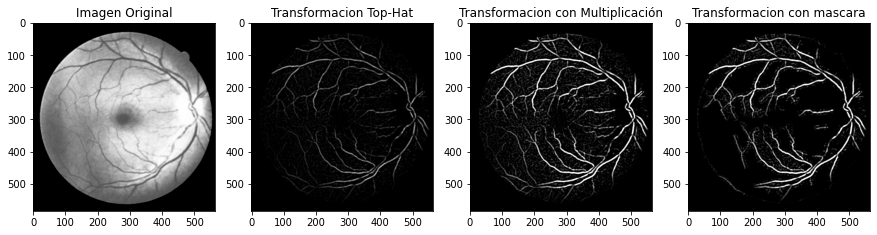

In [85]:
img = img_read('images/training/images/28_training.tif')
img = preprocesamiento(img) #preprocesamiento
thresholded = img > 80 #Umbralizacion para obtener la mascara
mask = skimage.img_as_ubyte(thresholded) #conversion de imagen
img = cv2.bitwise_and(img, mask) #aplicación de mascara
#Transformacion top-hat
selem = morph.disk(3)
thb = morph.black_tophat(img, selem)

#Mejora para la visualizacion de vasos
thbm = cv2.multiply(thb,7) #Multiplicación para aumentar brillo
##Remocion de objetos para obtener la mascara y eliminar ruido.
ojo = cv2.Canny(img,35,140)
imgB = ojo <= 90
erosion = morph.erosion(imgB,morph.rectangle(13,13))
remocion = morph.remove_small_objects(erosion,min_size = 2000, connectivity = 1) 
remocion = skimage.img_as_ubyte(remocion) #Conversion de imagen
lab = cv2.bitwise_not(remocion)
top = cv2.bitwise_and(thbm,lab) #aplicacion de mascara a la mejora de la transformacion. 


fig, ax = plt.subplots(1,4, figsize=(15, 8))

ax[0].set_title('Imagen Original')
ax[0].imshow(img, cmap='gray')
ax[1].set_title('Transformacion Top-Hat')
ax[1].imshow(thb, cmap='gray')
ax[2].set_title('Transformacion con Multiplicación')
ax[2].imshow(thbm, cmap='gray')
ax[3].set_title('Transformacion con mascara')
ax[3].imshow(top, cmap='gray')


In [86]:
#Imagen 3
topb3 = cv2.multiply(thb3,7)
lab3 = cv2.bitwise_not(remocion)
top3 = cv2.bitwise_and(topb3,lab3)#Se utiliza la mascara obtenida en la etiqueta de regiones (remocion de objetos pequeños)
#Imagen 5
topb5 = cv2.multiply(thb5,7)
lab5 = cv2.bitwise_not(remocion5)
top5 = cv2.bitwise_and(topb5,lab5)#Se utiliza la mascara obtenida en la etiqueta de regiones (remocion de objetos pequeños)

fig, ax = plt.subplots(2,3, figsize=(15, 7))
ax[0][0].set_title('Transformacion Top-Hat img 3')
ax[0][0].imshow(thb3, cmap='gray')
ax[0][1].set_title('Transformacion con Multiplicación')
ax[0][1].imshow(topb3, cmap='gray')
ax[0][2].set_title('Transformacion con mascara')
ax[0][2].imshow(top3, cmap='gray')
ax[1][0].set_title('Transformacion Top-Hat img 5')
ax[1][0].imshow(thb5, cmap='gray')
ax[1][1].set_title('Transformacion con Multiplicación')
ax[1][1].imshow(topb5, cmap='gray')
ax[1][2].set_title('Transformacion con mascara')
ax[1][2].imshow(top5, cmap='gray')

NameError: name 'remocion5' is not defined

### Transformacion Top-Hat con diferente preprocesamiento de la imagen

Para esta transformacion se utilizara como preprocesamiento de la imagen, la multiplicacion y el filtro gaussiano. 

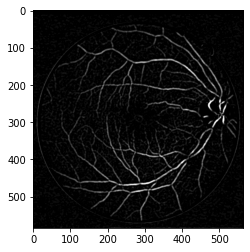

In [87]:
def preprocesamientoT(img):

    #Tomamos solo el canal G y aplicamos multiplicación
    img_mult = np.zeros(img.shape, np.uint8)
    multiplo = 1.2
    img_mult[:,:,1] = cv2.multiply(img[:,:,1], multiplo)
    img = img_mult[:,:,1]

    #Por ultimo aplicamos filtro Gaussiano
    res_final= cv2.GaussianBlur(img,(5, 5),2)
    
    return res_final

img = preprocesamientoT(imagen3)
selem = morph.disk(3)
thb = morph.black_tophat(img, selem) #Transformacion Top-Hat
img = cv2.multiply(thb, 12)
plt.imshow(img, cmap="gray")

# Morfologia:

### Dilatacion
Se toma la imagen con mascara y se saca bordes con la funcion Canny de OpenCV, ya que si se toma la imagen con mascara no mostrara ningun resultado aceptable ni con informacion.

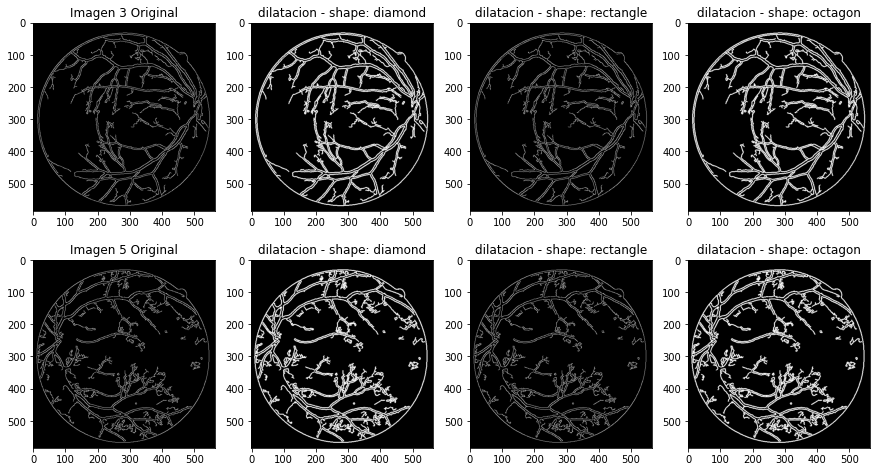

In [88]:
elem1 = morph.disk(1)
elem2 = morph.rectangle(1,1)
elem3 = morph.octagon(1,1)

img3 = cv2.Canny(img3m, 35, 140)
img5 = cv2.Canny(img5m, 35, 140)

dilatacion13 = morph.binary_dilation(img3,elem1)
dilatacion23 = morph.binary_dilation(img3,elem2)
dilatacion33 = morph.binary_dilation(img3,elem3)

dilatacion15 = morph.binary_dilation(img5,elem1)
dilatacion25 = morph.binary_dilation(img5,elem2)
dilatacion35 = morph.binary_dilation(img5,elem3)

fig, ax = plt.subplots(2,4, figsize=(15, 8))

ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3, cmap='gray')
ax[0][1].set_title('dilatacion - shape: diamond')
ax[0][1].imshow(dilatacion13, cmap='gray')
ax[0][2].set_title('dilatacion - shape: rectangle')
ax[0][2].imshow(dilatacion23, cmap='gray')
ax[0][3].set_title('dilatacion - shape: octagon')
ax[0][3].imshow(dilatacion33, cmap='gray')
ax[1][0].set_title('Imagen 5 Original')
ax[1][0].imshow(img5, cmap='gray')
ax[1][1].set_title('dilatacion - shape: diamond')
ax[1][1].imshow(dilatacion15, cmap='gray')
ax[1][2].set_title('dilatacion - shape: rectangle')
ax[1][2].imshow(dilatacion25, cmap='gray')
ax[1][3].set_title('dilatacion - shape: octagon')
ax[1][3].imshow(dilatacion35, cmap='gray')

<ipython-input-89-0e089474536c>:22: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  image_label_overlay = color.label2rgb(labels, image=ojo)


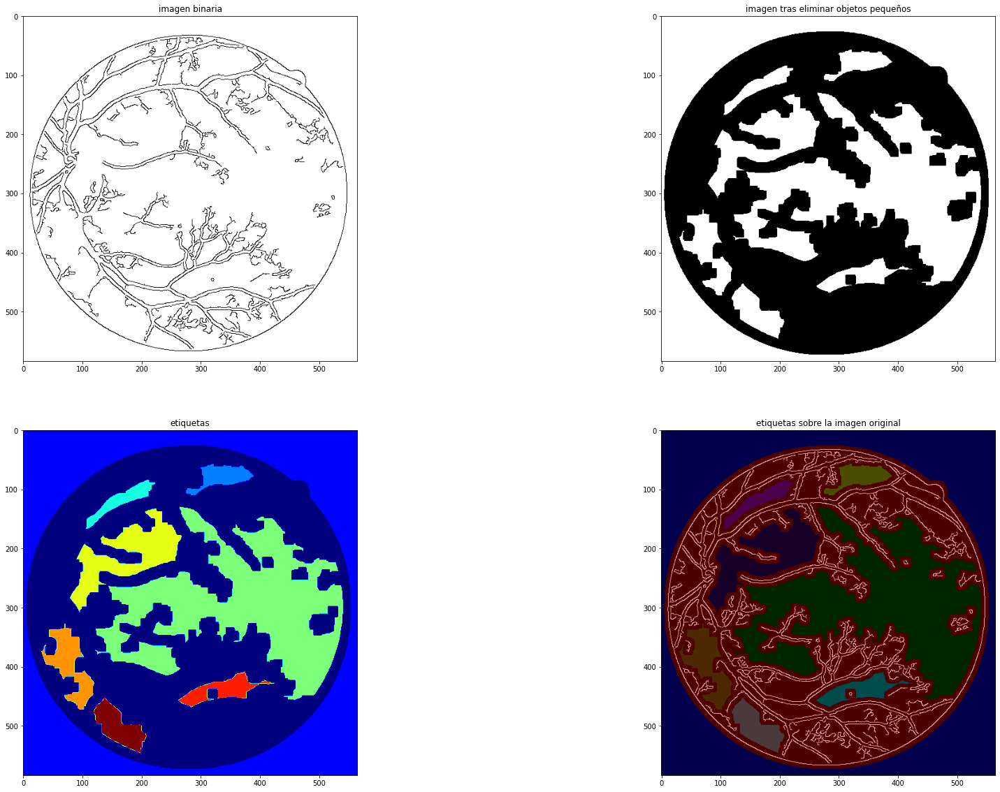

In [89]:
#Imagen 5

#Crear máscara
selem = morph.rectangle(13,13)

ojo = cv2.Canny(img5m,35,140)

#Leer imagen de entrada y binarizarla en una copia
imgB = ojo <= 90

#Aplicar una erosión sobre la imagen copia
erosion_once13 = morph.binary_erosion(imgB,selem)

#Aplicar una eliminación de objetos pequeños sobre la imagen erosionada
objetos_pequeños_eliminados = morph.remove_small_objects(erosion_once13,min_size = 2000, connectivity = 1)
remocion5 = skimage.img_as_ubyte(objetos_pequeños_eliminados)
#Etiquetar la imagen mediante la función label de skimage, cuyos parámetros son la imagen
#el número de vecinos, la conectividad
labels, num_labels = morph.label(objetos_pequeños_eliminados, return_num=True, connectivity= 1)

#Caracterizar los labels, mediante colores y sobre la imagen original
image_label_overlay = color.label2rgb(labels, image=ojo)

#Generar subplot 2x2 para mostrar imagen original, eliminación de objetos pequeños(que actúa como máscara)
#y los labels de la información extraída
fig, ((ax1,ax2),(ax3, ax4)) = plt.subplots(2,2, figsize=(30,20))
ax1.set_title('imagen binaria')

ax1.imshow(imgB, cmap='gray')
ax2.set_title('imagen tras eliminar objetos pequeños')
ax2.imshow(objetos_pequeños_eliminados, cmap='gray')
ax3.set_title('etiquetas')
ax3.imshow(labels, cmap='jet')
ax4.set_title('etiquetas sobre la imagen original')
ax4.imshow(image_label_overlay, cmap='jet')

### Apertura

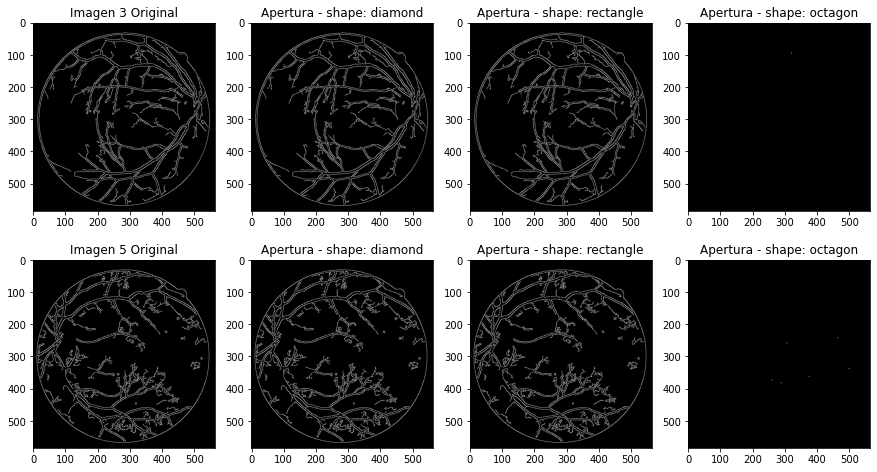

In [90]:
elem1 = morph.diamond(0)
elem2 = morph.rectangle(1,1)
elem3 = morph.octagon(1,1)
#Imagen 3
opening13 = morph.binary_opening(img3,elem1)
opening23 = morph.binary_opening(img3,elem2)
opening33 = morph.binary_opening(img3,elem3)
#Imagen 5
opening15 = morph.binary_opening(img5,elem1)
opening25 = morph.binary_opening(img5,elem2)
opening35 = morph.binary_opening(img5,elem3)

fig, ax = plt.subplots(2,4, figsize=(15, 8))

ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3, cmap='gray')
ax[0][1].set_title('Apertura - shape: diamond')
ax[0][1].imshow(opening13, cmap='gray')
ax[0][2].set_title('Apertura - shape: rectangle')
ax[0][2].imshow(opening23, cmap='gray')
ax[0][3].set_title('Apertura - shape: octagon')
ax[0][3].imshow(opening33, cmap='gray')
ax[1][0].set_title('Imagen 5 Original')
ax[1][0].imshow(img5, cmap='gray')
ax[1][1].set_title('Apertura - shape: diamond')
ax[1][1].imshow(opening15, cmap='gray')
ax[1][2].set_title('Apertura - shape: rectangle')
ax[1][2].imshow(opening25, cmap='gray')
ax[1][3].set_title('Apertura - shape: octagon')
ax[1][3].imshow(opening35, cmap='gray')

### Cierre

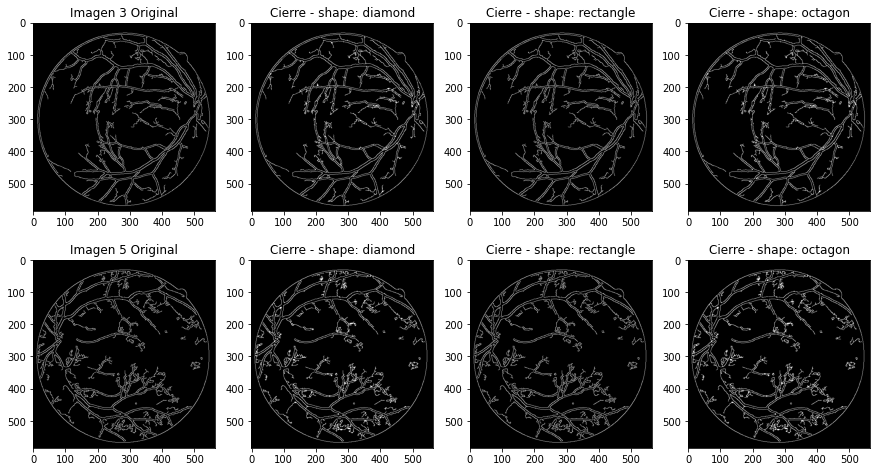

In [91]:
elem1 = morph.diamond(1)
elem2 = morph.rectangle(1,1)
elem3 = morph.octagon(1,1)
#Imagen 3
closing13 = morph.binary_closing(img3,elem1)
closing23 = morph.binary_closing(img3,elem2)
closing33 = morph.binary_closing(img3,elem3)
#Imagen 5
closing15 = morph.binary_closing(img5,elem1)
closing25 = morph.binary_closing(img5,elem2)
closing35 = morph.binary_closing(img5,elem3)

fig, ax = plt.subplots(2,4, figsize=(15, 8))

ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3, cmap='gray')
ax[0][1].set_title('Cierre - shape: diamond')
ax[0][1].imshow(closing13, cmap='gray')
ax[0][2].set_title('Cierre - shape: rectangle')
ax[0][2].imshow(closing23, cmap='gray')
ax[0][3].set_title('Cierre - shape: octagon')
ax[0][3].imshow(closing33, cmap='gray')
ax[1][0].set_title('Imagen 5 Original')
ax[1][0].imshow(img5, cmap='gray')
ax[1][1].set_title('Cierre - shape: diamond')
ax[1][1].imshow(closing15, cmap='gray')
ax[1][2].set_title('Cierre - shape: rectangle')
ax[1][2].imshow(closing25, cmap='gray')
ax[1][3].set_title('Cierre - shape: octagon')
ax[1][3].imshow(closing35, cmap='gray')

### Extración de bordes con morfologia

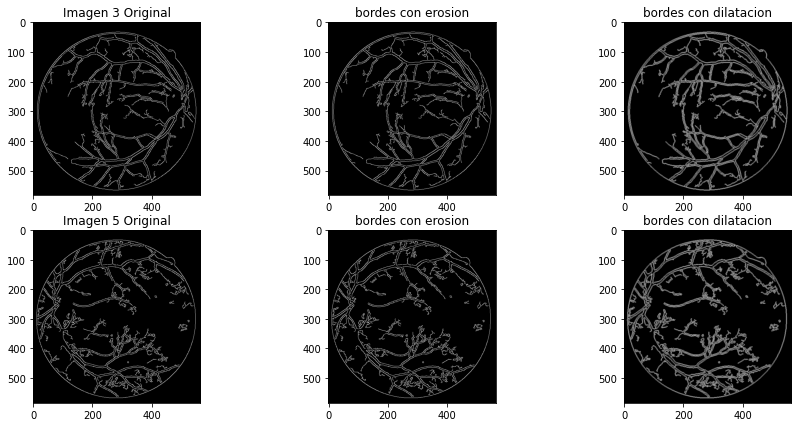

In [92]:
img3 = img3>0
img5 = img5>0

selem = morph.disk(1)
#Imagen 3
dilatacion3 = morph.binary_dilation(img3,selem)
erosion3 = morph.binary_erosion(img3,selem)
#Imagen 5
dilatacion5 = morph.binary_dilation(img5,selem)
erosion5 = morph.binary_erosion(img5,selem)


fig, ax = plt.subplots(2,3, figsize=(15, 7))
ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3, cmap='gray')
ax[0][1].set_title('bordes con erosion')
ax[0][1].imshow(np.logical_xor(img3,erosion3), cmap='gray')
ax[0][2].set_title('bordes con dilatacion')
ax[0][2].imshow(np.logical_xor(img3, dilatacion3), cmap='gray')
ax[1][0].set_title('Imagen 5 Original')
ax[1][0].imshow(img5, cmap='gray')
ax[1][1].set_title('bordes con erosion')
ax[1][1].imshow(np.logical_xor(img5,erosion5), cmap='gray')
ax[1][2].set_title('bordes con dilatacion')
ax[1][2].imshow(np.logical_xor(img5, dilatacion5), cmap='gray')

### Rellenado de huecos

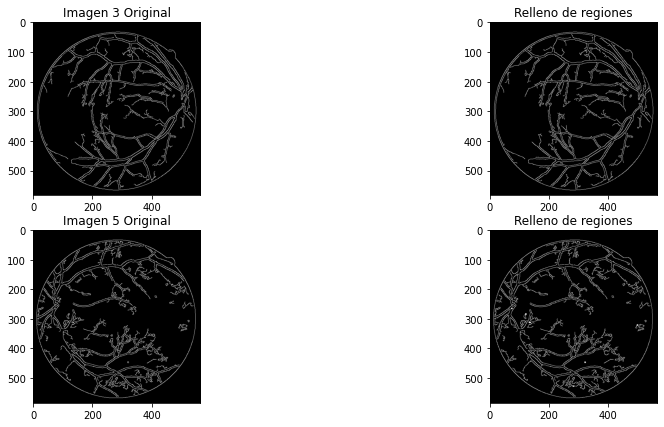

In [93]:
#Realizar un llenado de agujeros pequeños, cuyos parámetros son la imagen que deseo rellenar
#y el área mínima a partir de la cual se llenará el hueco
filled3 = morph.remove_small_holes(img3,area_threshold=10) #min_size es el area en pixeles de los huecos a rellenar
filled5 = morph.remove_small_holes(img5,area_threshold=10)

#Crear subplot 1x2 que muestre imagen original e imagen rellena
# fig, (ax1,ax2) = plt.subplots(1,2, figsize=(8, 4))
# ax1.set_title('imagen original')
# ax1.imshow(img, cmap='gray')
# ax2.set_title('Relleno de regiones')
# ax2.imshow(filled, cmap='gray')

fig, ax = plt.subplots(2,2, figsize=(15, 7))
ax[0][0].set_title('Imagen 3 Original')
ax[0][0].imshow(img3, cmap='gray')
ax[0][1].set_title('Relleno de regiones')
ax[0][1].imshow(filled3, cmap='gray')
ax[1][0].set_title('Imagen 5 Original')
ax[1][0].imshow(img5, cmap='gray')
ax[1][1].set_title('Relleno de regiones')
ax[1][1].imshow(filled5, cmap='gray')

### Etiquetado de regiones

<ipython-input-94-46e9122785f9>:20: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  image_label_overlay = color.label2rgb(labels, image=ojo)


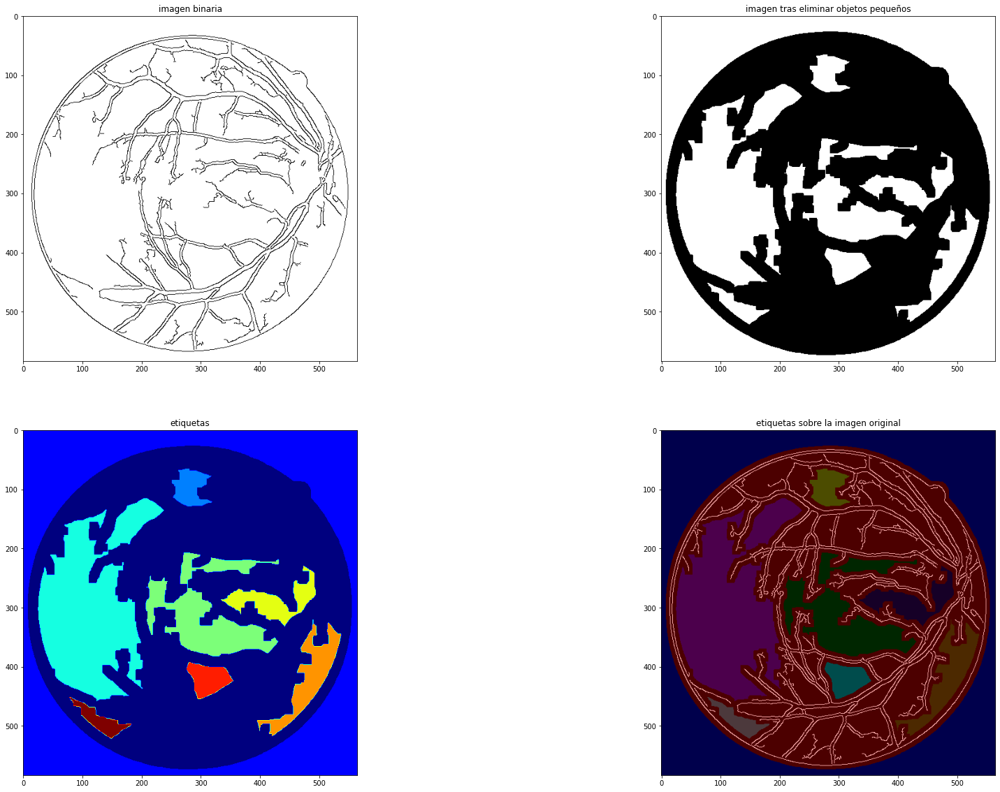

In [94]:

#Crear máscara
selem = morph.rectangle(13,13)

ojo = cv2.Canny(img3m,35,140)

#Leer imagen de entrada y binarizarla en una copia
imgB = ojo <= 90

#Aplicar una erosión sobre la imagen copia
erosion_once13 = morph.binary_erosion(imgB,selem)

#Aplicar una eliminación de objetos pequeños sobre la imagen erosionada
objetos_pequeños_eliminados = morph.remove_small_objects(erosion_once13,min_size = 2000, connectivity = 1)
remocion = skimage.img_as_ubyte(objetos_pequeños_eliminados)
#Etiquetar la imagen mediante la función label de skimage, cuyos parámetros son la imagen
#el número de vecinos, la conectividad
labels, num_labels = morph.label(objetos_pequeños_eliminados, return_num=True, connectivity= 1)

#Caracterizar los labels, mediante colores y sobre la imagen original
image_label_overlay = color.label2rgb(labels, image=ojo)

#Generar subplot 2x2 para mostrar imagen original, eliminación de objetos pequeños(que actúa como máscara)
#y los labels de la información extraída
fig, ((ax1,ax2),(ax3, ax4)) = plt.subplots(2,2, figsize=(30,20))
ax1.set_title('imagen binaria')

ax1.imshow(imgB, cmap='gray')
ax2.set_title('imagen tras eliminar objetos pequeños')
ax2.imshow(objetos_pequeños_eliminados, cmap='gray')
ax3.set_title('etiquetas')
ax3.imshow(labels, cmap='jet')
ax4.set_title('etiquetas sobre la imagen original')
ax4.imshow(image_label_overlay, cmap='jet')

### Extracción de esqueletos

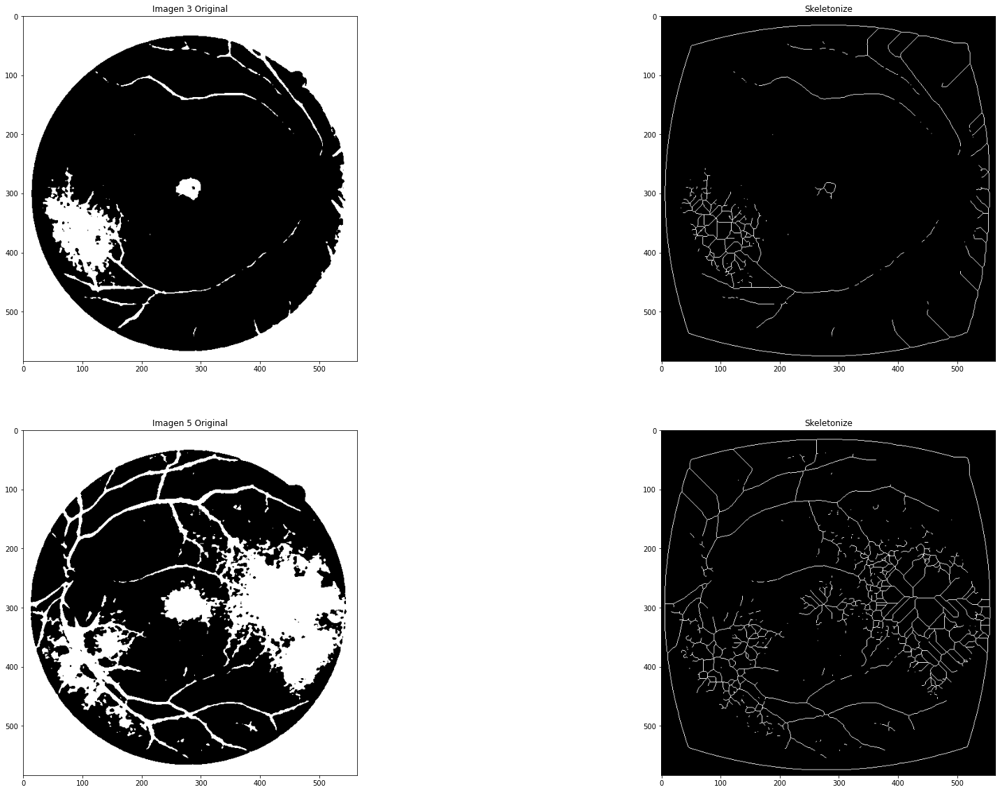

In [95]:
img3 = img3m < 99
img5 = img5m < 99

#Aplicar la función de esquelización de skimage, cuyo único parámetro de entrada es la imagen
skeleton3 = morph.skeletonize(img3)
skeleton5 = morph.skeletonize(img5)

fig, ((ax1,ax2),(ax3, ax4)) = plt.subplots(2,2, figsize=(30,20))
ax1.set_title('Imagen 3 Original')
ax1.imshow(img3, cmap='gray')
ax2.set_title('Skeletonize')
ax2.imshow(skeleton3, cmap='gray')
ax3.set_title('Imagen 5 Original')
ax3.imshow(img5, cmap='gray')
ax4.set_title('Skeletonize')
ax4.imshow(skeleton5, cmap='gray')

## Descriptor de area 

In [96]:
from skimage.measure import label
import numpy as np
import matplotlib.pyplot as plt

from skimage.draw import ellipse
from skimage.measure import label, regionprops
from skimage.transform import rotate

#### Con Dilatación 

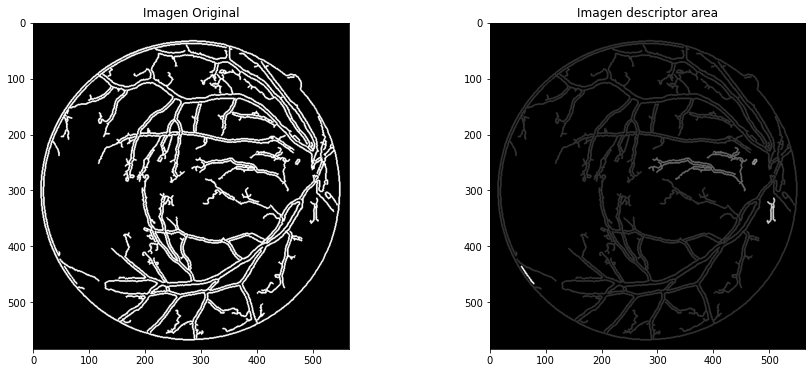

In [97]:
label_img = label(dilatacion13)
props = regionprops(label_img)

fig, (ax, ax2)= plt.subplots(1,2, figsize=(15, 6))
ax2.set_title('Imagen descriptor area')
ax2.imshow(label_img, cmap='gray')
ax.set_title('Imagen Original')
ax.imshow(dilatacion13, cmap ='gray')

#### Imagen Original

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


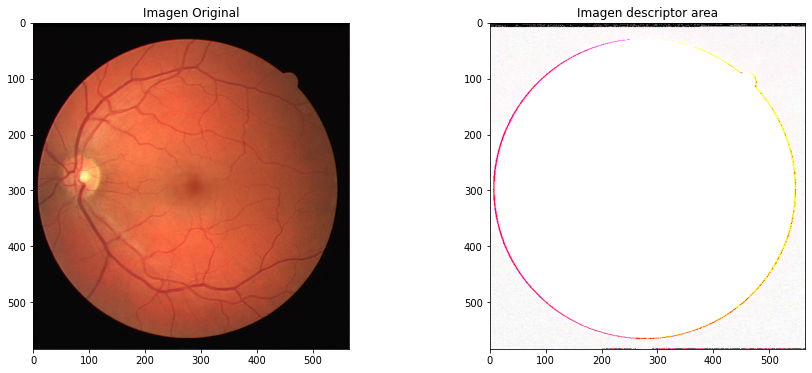

In [98]:
img_rgb = img_read('images/training/images/35_training.tif')
label_img = label(img_rgb)
props = regionprops(label_img)

fig, (ax, ax2)= plt.subplots(1,2, figsize=(15, 6))
ax2.set_title('Imagen descriptor area')
ax2.imshow(label_img, cmap='gray')
ax.set_title('Imagen Original')
ax.imshow(img_rgb, cmap ='gray')

#### Apertura

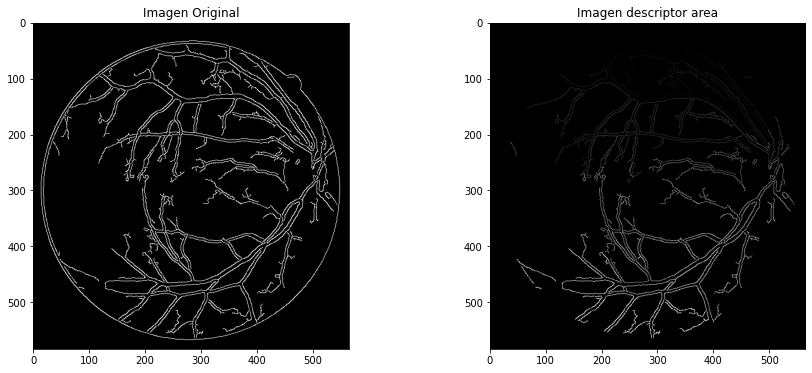

In [101]:

label_img = label(opening13)
props = regionprops(label_img)

fig, (ax, ax2)= plt.subplots(1,2, figsize=(15, 6))
ax2.set_title('Imagen descriptor area')
ax2.imshow(label_img, cmap='gray')
ax.set_title('Imagen Original')
ax.imshow(opening13, cmap ='gray')

#### TOP HAT 

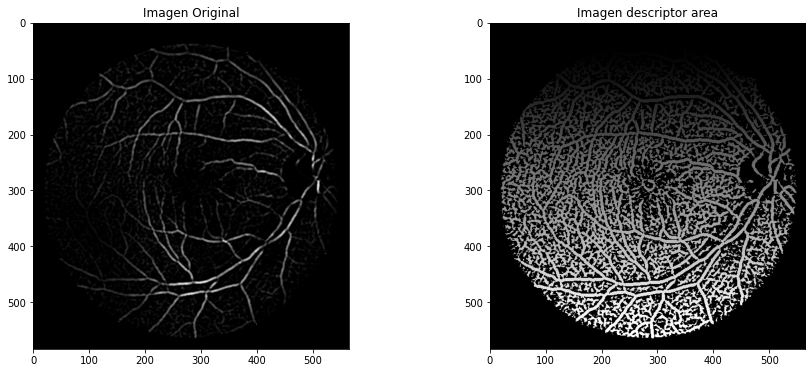

In [100]:

label_img = label(thb3)
props = regionprops(label_img)

fig, (ax, ax2)= plt.subplots(1,2, figsize=(15, 6))
ax2.set_title('Imagen descriptor area')
ax2.imshow(label_img, cmap='gray')
ax.set_title('Imagen Original')
ax.imshow(thb3, cmap ='gray')

 #### Top-Hat Con multiplicación

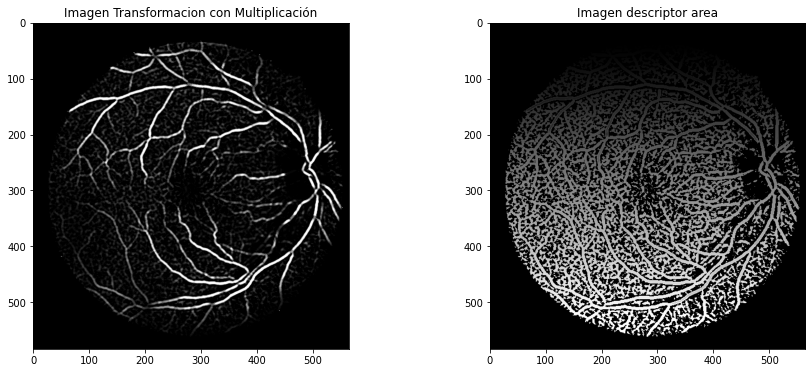

In [106]:
label_img = label(thbm)
props = regionprops(label_img)

fig, (ax, ax2)= plt.subplots(1,2, figsize=(15, 6))
ax2.set_title('Imagen descriptor area')
ax2.imshow(label_img, cmap='gray')
ax.set_title('Imagen Transformacion con Multiplicación')
ax.imshow(thbm, cmap ='gray')

#### Top-Hat con Mascara

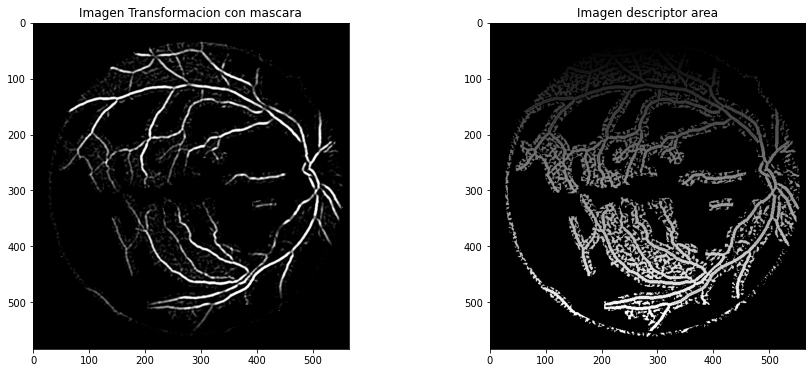

In [105]:

label_img = label(top)
props = regionprops(label_img)

fig, (ax, ax2)= plt.subplots(1,2, figsize=(15, 6))
ax2.set_title('Imagen descriptor area')
ax2.imshow(label_img, cmap='gray')
ax.set_title('Imagen Transformacion con mascara')
ax.imshow(top, cmap ='gray')

#### Top Hat con preprocesamiento Diferente

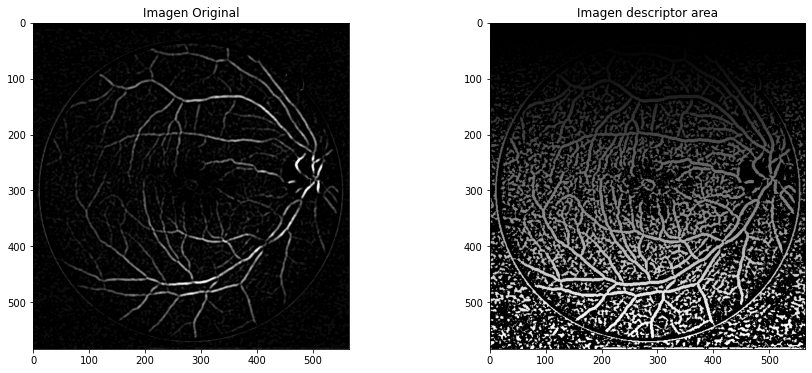

In [104]:
img = preprocesamientoT(imagen3)
selem = morph.disk(3)
thb = morph.black_tophat(img, selem) #Transformacion Top-Hat
img = cv2.multiply(thb, 12)

label_img = label(img)
props = regionprops(label_img)

fig, (ax, ax2)= plt.subplots(1,2, figsize=(15, 6))
ax2.set_title('Imagen descriptor area')
ax2.imshow(label_img, cmap='gray')
ax.set_title('Imagen Transformacion con Preprocesamiento distinto')
ax.imshow(img, cmap ='gray')